In [2]:
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import dataAgglomeration as da
from matplotlib import rcParams
import matplotlib.patches as patches
import matplotlib.lines as lines
from matplotlib.lines import Line2D
import random
rcParams["figure.dpi"] = 400
import sys
print(sys.path)

['/work/groups/da_mma_b/jun/TwoPhaseFlow/run/nonOrthog/staticSphere', '', '/work/projects/project01456/pyfoam/lib64/python3.6/site-packages', '/home/jl95muce/.local/lib/python3.9/site-packages', '/work/groups/da_mma_b/jun/TwoPhaseFlow/run/nonOrthog/staticSphere', '/work/groups/da_mma_b/jun/TwoPhaseFlow/scripts/modules', '/shared/apps/.gcc/9.2/.openmpi/4.0/python/3.9.5/lib/python39.zip', '/shared/apps/.gcc/9.2/.openmpi/4.0/python/3.9.5/lib/python3.9', '/shared/apps/.gcc/9.2/.openmpi/4.0/python/3.9.5/lib/python3.9/lib-dynload', '/shared/apps/.gcc/9.2/.openmpi/4.0/python/3.9.5/lib/python3.9/site-packages', '/shared/apps/.gcc/9.2/.openmpi/4.0/python/3.9.5/lib/python3.9/site-packages/IPython/extensions', '/work/home/jl95muce/.ipython']


In [34]:
PIMPLEN30n1.columns

Index(['Time', 'min(U)', 'max(U)', 'min(p)', 'max(p)'], dtype='object')

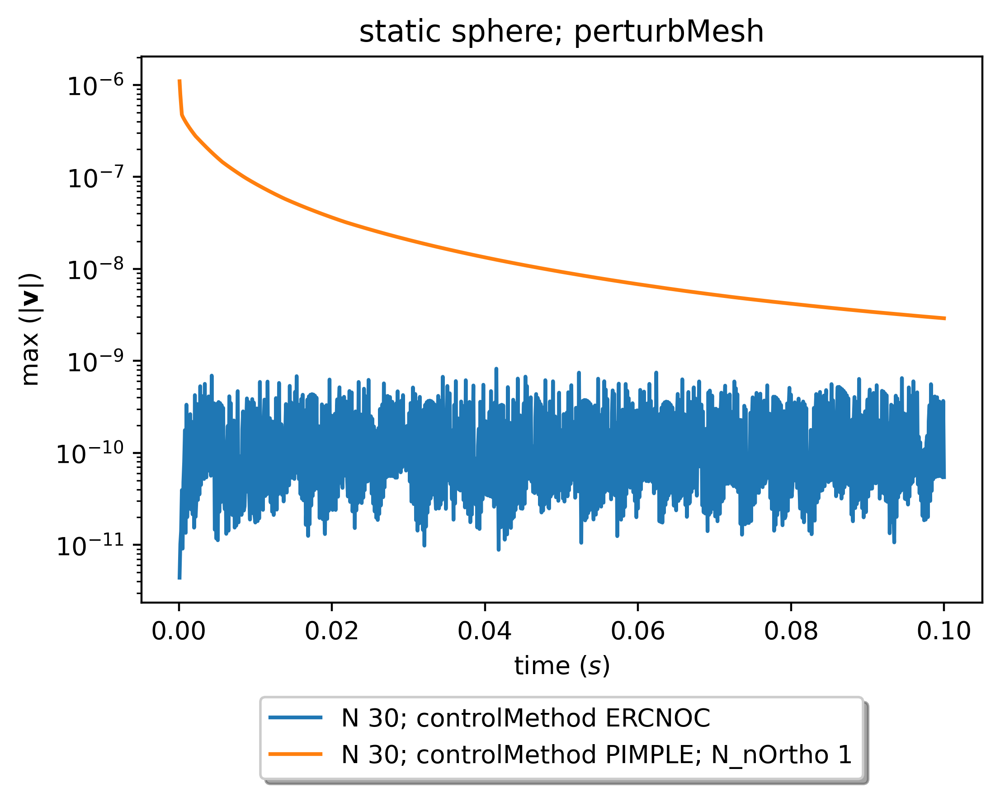

In [35]:
control = 'ERCNOC'
Type = "perturbMesh"
resolution = 30
df = dframe_magU.loc[(control,Type,resolution),:]
plt.plot(df["Time"],df["max(U)"], label="N %s; controlMethod %s" % (resolution, control))#, marker=marker)
plt.plot(PIMPLEN30n1["Time"],PIMPLEN30n1["max(U)"], label="N %s; controlMethod %s; N_nOrtho 1" % (resolution, 'PIMPLE'))

plt.title("static sphere; %s" % (Type))
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15),
      fancybox=True, shadow=True, ncol=1)
plt.yscale("log")
plt.xlabel(r"time $(s)$")
plt.ylabel(r"max $(|\mathbf{v}|)$")
plt.show()

In [20]:
def plot_magU(dframe, meshType, resolution):
    meshTypes = [meshType]#dframe.index.get_level_values("yRotateDeg").unique()
    resolutions = [resolution]
    nonOrthogControls = dframe.index.get_level_values("nonOrthogControl").unique()
    #gravityModels = [model]#['gravity', 'gravityDirac', 'gravityRecon']
    #marker_list = list(Line2D.markers.keys()) #['o', 'v', '^', '<', '>', 's', 'p', '*', 'h', 'H', '+', 'x', 'D', 'd', '|', '_']
    #marker_list = ['o', 'v']
    
    for resolution in resolutions:
        #marker = random.choice(marker_list)
        for Type in meshTypes:
            for control in nonOrthogControls:
                df = dframe.loc[(control,Type,resolution),:]
                plt.plot(df["Time"],df["max(U)"], label="N %s; controlMethod %s" % (resolution, control))#, marker=marker)

    plt.title("static sphere; %s" % (Type))
    plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15),
          fancybox=True, shadow=True, ncol=1)
    plt.yscale("log")
    plt.xlabel(r"time $(s)$")
    plt.ylabel(r"max $(|\mathbf{v}|)$")
    plt.show()

In [11]:
def print_magU(dframe):
    meshTypes = dframe.index.get_level_values("meshType").unique()
    resolutions = dframe.index.get_level_values("resolution").unique()
    nonOrthogControls = dframe.index.get_level_values("nonOrthogControl").unique()
    #gravityModels = [model]#['gravity', 'gravityDirac', 'gravityRecon']
    #marker_list = list(Line2D.markers.keys()) #['o', 'v', '^', '<', '>', 's', 'p', '*', 'h', 'H', '+', 'x', 'D', 'd', '|', '_']
    #marker_list = ['o', 'v']
    
    for resolution in resolutions:
        #marker = random.choice(marker_list)
        for Type in meshTypes:
            for control in nonOrthogControls:
                df = dframe.loc[(control,Type,resolution),:]
                print(" %s %s %s: maxU: %s" % (control, Type, resolution, df["max(U)"].iloc[0]))
                #plt.plot(df["Time"],df["max(U)"], label="N %s; controlMethod %s" % (resolution, control))#, marker=marker)

    #plt.title("static sphere; %s" % (Type))
    #plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15),
          #fancybox=True, shadow=True, ncol=1)
    #plt.yscale("log")
    #plt.xlabel(r"time $(s)$")
    #plt.ylabel(r"max $(|\mathbf{v}|)$")
    #plt.show()

In [18]:
def print_magprgh(dframe):
    meshTypes = dframe.index.get_level_values("meshType").unique()
    resolutions = dframe.index.get_level_values("resolution").unique()
    nonOrthogControls = dframe.index.get_level_values("nonOrthogControl").unique()
    #gravityModels = [model]#['gravity', 'gravityDirac', 'gravityRecon']
    #marker_list = list(Line2D.markers.keys()) #['o', 'v', '^', '<', '>', 's', 'p', '*', 'h', 'H', '+', 'x', 'D', 'd', '|', '_']
    #marker_list = ['o', 'v']
    
    for resolution in resolutions:
        #marker = random.choice(marker_list)
        for Type in meshTypes:
            for control in nonOrthogControls:
                df = dframe.loc[(control,Type,resolution),:]
                ePrgh = (df["max(p_rgh)"].iloc[-1]-df["min(p_rgh)"].iloc[-1] - 145.48)/145.48
                print(" %s %s %s: max(p_rgh): %s" % (control, Type, resolution, ePrgh))#f'{ePrgh:.20f}'))

In [3]:
agglomerator = da.data_agglomerator("static3DSphere.parameter.bak","postProcessing/fieldMinMax1/0/fieldMinMax.dat", 
                                     "./InterFlow-static3DSphere_00000_template")
agglomerator.show_failed_variations()
agglomerator.write_agglomerated_study_data("InterFlow_staticSphere.csv")
dframe_magU = agglomerator.study_dataframe()
dframe_magU = dframe_magU.sort_index()
idx = pd.IndexSlice

agglomerator = da.data_agglomerator("Nnon-static3DSphere.parameter","postProcessing/fieldMinMax1/0/fieldMinMax.dat", 
                                     "./Nnon-static3DSphere_00000_template")
agglomerator.show_failed_variations()
agglomerator.write_agglomerated_study_data("InterFlow_staticSphere_Nnon.csv")
dframe_magNnon = agglomerator.study_dataframe()
dframe_magNnon = dframe_magNnon.sort_index()

Variants without valid data:
----------------------------
#Variation | Reason
----------------------------
[['ERCNOC', 'PIMPLE'], ['blockMesh', 'perturbMesh', 'polyMesh'], [30, 60, 90], [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, ...]]
['nonOrthogControl', 'meshType', 'resolution', 'step']
Variants without valid data:
----------------------------
#Variation | Reason
----------------------------
[[1, 4, 9], ['PIMPLE'], ['blockMesh', 'perturbMesh', 'polyMesh'], [30, 60, 90], [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 

In [4]:
agglomerator = da.data_agglomerator("static3DSphere.parameter.bak","postProcessing/fieldMinMax1/0/fieldMinMax.dat", 
                                     "./testCurvModel/InterFlow-static3DSphere_00000_template")
agglomerator.show_failed_variations()
agglomerator.write_agglomerated_study_data("testCurvModel_InterFlow_staticSphere.csv")
dframe_magU_testCurvModel = agglomerator.study_dataframe()
dframe_magU_testCurvModel = dframe_magU_testCurvModel.sort_index()

agglomerator = da.data_agglomerator("Nnon-static3DSphere.parameter","postProcessing/fieldMinMax1/0/fieldMinMax.dat", 
                                     "./testCurvModel/Nnon-static3DSphere_00000_template")
agglomerator.show_failed_variations()
agglomerator.write_agglomerated_study_data("testCurvModel_InterFlow_staticSphere_Nnon.csv")
dframe_magNnon_testCurvModel = agglomerator.study_dataframe()
dframe_magNnon_testCurvModel = dframe_magNnon_testCurvModel.sort_index()

Variants without valid data:
----------------------------
#Variation | Reason
----------------------------
[['ERCNOC', 'PIMPLE'], ['blockMesh', 'perturbMesh', 'polyMesh'], [30, 60, 90], [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, ...]]
['nonOrthogControl', 'meshType', 'resolution', 'step']
Variants without valid data:
----------------------------
#Variation | Reason
----------------------------
[[1, 4, 9], ['PIMPLE'], ['blockMesh', 'perturbMesh', 'polyMesh'], [30, 60, 90], [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 

In [18]:
agglomerator = da.data_agglomerator("static3DSphere.parameter.bak","postProcessing/fieldMinMax1/0/fieldMinMax.dat", 
                                     "./testLeastSquares/InterFlow-static3DSphere_00000_template")
agglomerator.show_failed_variations()
agglomerator.write_agglomerated_study_data("testLeastSquares_InterFlow_staticSphere.csv")
dframe_magU_testLeastSquares = agglomerator.study_dataframe()
dframe_magU_testLeastSquares = dframe_magU_testLeastSquares.sort_index()

agglomerator = da.data_agglomerator("Nnon-static3DSphere.parameter","postProcessing/fieldMinMax1/0/fieldMinMax.dat", 
                                     "./testLeastSquares/Nnon-static3DSphere_00000_template")
agglomerator.show_failed_variations()
agglomerator.write_agglomerated_study_data("testLeastSquares_InterFlow_staticSphere_Nnon.csv")
dframe_magNnon_testLeastSquares = agglomerator.study_dataframe()
dframe_magNnon_testLeastSquares = dframe_magNnon_testLeastSquares.sort_index()

Variants without valid data:
----------------------------
#Variation | Reason
----------------------------
[['ERCNOC', 'PIMPLE'], ['blockMesh', 'perturbMesh', 'polyMesh'], [30, 60, 90], [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, ...]]
['nonOrthogControl', 'meshType', 'resolution', 'step']
Variants without valid data:
----------------------------
#Variation | Reason
----------------------------
[[1, 4, 9], ['PIMPLE'], ['blockMesh', 'perturbMesh', 'polyMesh'], [30, 60, 90], [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 

In [47]:
def print_LS_Nnon(dframe):
    resolutions =[30,60,90]
    for resolution in resolutions:
                df = dframe.loc[resolution,:]
                maxU = df["max(U)"].iloc[-1]
                maxDelp = (df["max(p_rgh)"].iloc[-1]-df["min(p_rgh)"].iloc[-1] - 145.48)/145.48
                print("maxU: %s, maxDelp: %s" % (maxU, maxDelp))
                
dfN30_ERCNOC_testLeastSquares = dframe_magU_testLeastSquares.loc[('ERCNOC','perturbMesh'),:]
dfN30_PIMPLE10_testLeastSquares = dframe_magNnon_testLeastSquares.loc[(9,'perturbMesh'),:]
dfN30_ERCNOC_testMULES = dframe_magU_testMULES.loc['perturbMesh',:]
print_LS_Nnon(dfN30_ERCNOC_testMULES)

maxU: 6.1017786559931e-12, maxDelp: 5.651911285548446e-13
maxU: 9.67751611785254e-11, maxDelp: 1.2905425361242975e-11
maxU: 1.87684068966233e-10, maxDelp: 1.263113281216209e-10


In [35]:
(145.48000000073+1.0731637634835e-10 - 145.48)/145.48

5.755650134239294e-12

In [40]:
agglomerator = da.data_agglomerator("testMULES/static3DSphere.parameter.bak","postProcessing/fieldMinMax1/0/fieldMinMax.dat", 
                                     "./testMULES/InterFlow-static3DSphere_00000_template")
agglomerator.show_failed_variations()
agglomerator.write_agglomerated_study_data("testMULES/testMULES_InterFlow_staticSphere.csv")
dframe_magU_testMULES = agglomerator.study_dataframe()
dframe_magU_testMULES = dframe_magU_testMULES.sort_index()

Variants without valid data:
----------------------------
#Variation | Reason
----------------------------
[['ERCNOC'], ['blockMesh', 'perturbMesh', 'polyMesh'], [30, 60, 90], [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, ...]]
['nonOrthogControl', 'meshType', 'resolution', 'step']


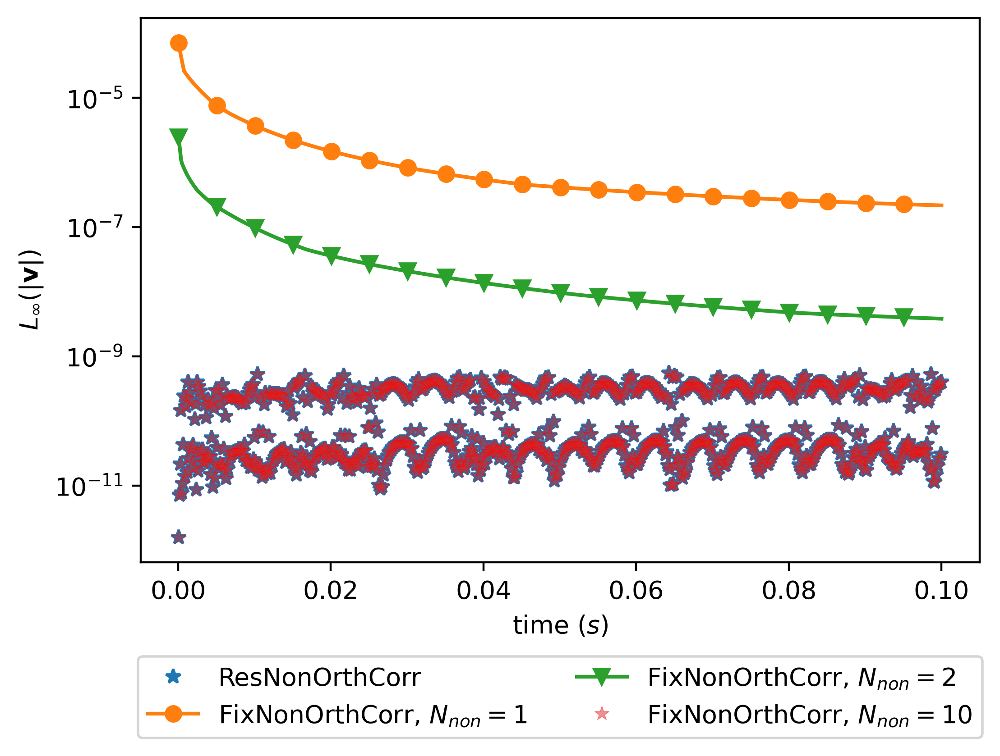

In [38]:
dfN30_ERCNOC = dframe_magU.loc[('ERCNOC','perturbMesh',30),:]
dfN30_PIMPLE1 = dframe_magU.loc[('PIMPLE','perturbMesh',30),:]
dfN30_PIMPLE2 = dframe_magNnon.loc[(1,'perturbMesh',30),:]
dfN30_PIMPLE5 = dframe_magNnon.loc[(4,'perturbMesh',30),:]
dfN30_PIMPLE10 = dframe_magNnon.loc[(9,'perturbMesh',30),:]
#['o', 'v', '^', '<', '>', 's', 'p', '*', 'h', 'H', '+', 'x', 'D', 'd', '|', '_']
plt.plot(dfN30_ERCNOC["Time"],dfN30_ERCNOC["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr") #, marker='+',markevery=50)
plt.plot(dfN30_PIMPLE1["Time"],dfN30_PIMPLE1["max(U)"], label=r"FixNonOrthCorr, $N_{non}=1$", marker='o',markevery=50)
plt.plot(dfN30_PIMPLE2["Time"],dfN30_PIMPLE2["max(U)"], label=r"FixNonOrthCorr, $N_{non}=2$", marker='v',markevery=50)
plt.plot(dfN30_PIMPLE10["Time"],dfN30_PIMPLE10["max(U)"], label=r"FixNonOrthCorr, $N_{non}=10$", marker='*',markevery=1,
         #markerfacecolor="None",
         markeredgecolor='red', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)
#plt.plot(dfN30_PIMPLE10["Time"],dfN30_PIMPLE10["max(U)"], label="PIMEPLE, Nnon=10") ,linestyle='None'

#plt.title("static sphere; %s" % (Type))
#plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15),
#      fancybox=True, shadow=True, ncol=1)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.yscale("log")
plt.xlabel(r"time $(s)$")
plt.ylabel(r"$L_{\infty}(|\mathbf{v}|)$")
plt.show()

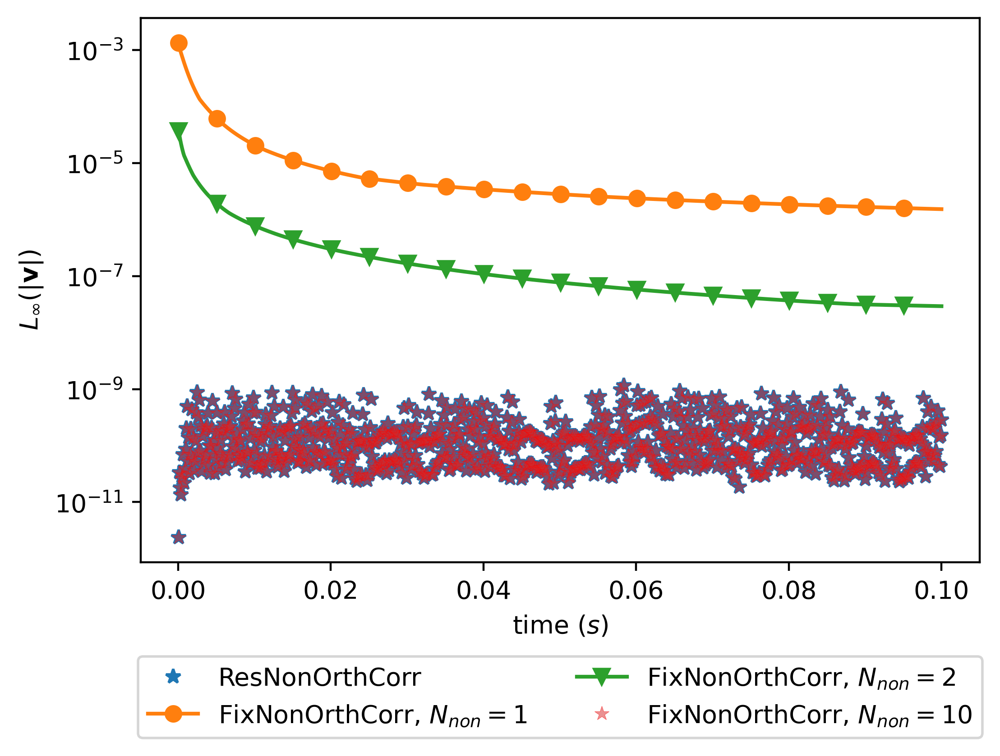

In [39]:
dfN60_ERCNOC = dframe_magU.loc[('ERCNOC','perturbMesh',60),:]
dfN60_PIMPLE1 = dframe_magU.loc[('PIMPLE','perturbMesh',60),:]
dfN60_PIMPLE2 = dframe_magNnon.loc[(1,'perturbMesh',60),:]
dfN60_PIMPLE5 = dframe_magNnon.loc[(4,'perturbMesh',60),:]
dfN60_PIMPLE10 = dframe_magNnon.loc[(9,'perturbMesh',60),:]
#['o', 'v', '^', '<', '>', 's', 'p', '*', 'h', 'H', '+', 'x', 'D', 'd', '|', '_']
plt.plot(dfN60_ERCNOC["Time"],dfN60_ERCNOC["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr") #, marker='+',markevery=50)
plt.plot(dfN60_PIMPLE1["Time"],dfN60_PIMPLE1["max(U)"], label=r"FixNonOrthCorr, $N_{non}=1$", marker='o',markevery=50)
plt.plot(dfN60_PIMPLE2["Time"],dfN60_PIMPLE2["max(U)"], label=r"FixNonOrthCorr, $N_{non}=2$", marker='v',markevery=50)
plt.plot(dfN60_PIMPLE10["Time"],dfN60_PIMPLE10["max(U)"], label=r"FixNonOrthCorr, $N_{non}=10$", marker='*',markevery=1,
         #markerfacecolor="None",
         markeredgecolor='red', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)
#plt.plot(dfN60_PIMPLE10["Time"],dfN60_PIMPLE10["max(U)"], label="PIMEPLE, Nnon=10")

#plt.title("static sphere; %s" % (Type))
#plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15),
#      fancybox=True, shadow=True, ncol=1)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.yscale("log")
plt.xlabel(r"time $(s)$")
plt.ylabel(r"$L_{\infty}(|\mathbf{v}|)$")
plt.show()

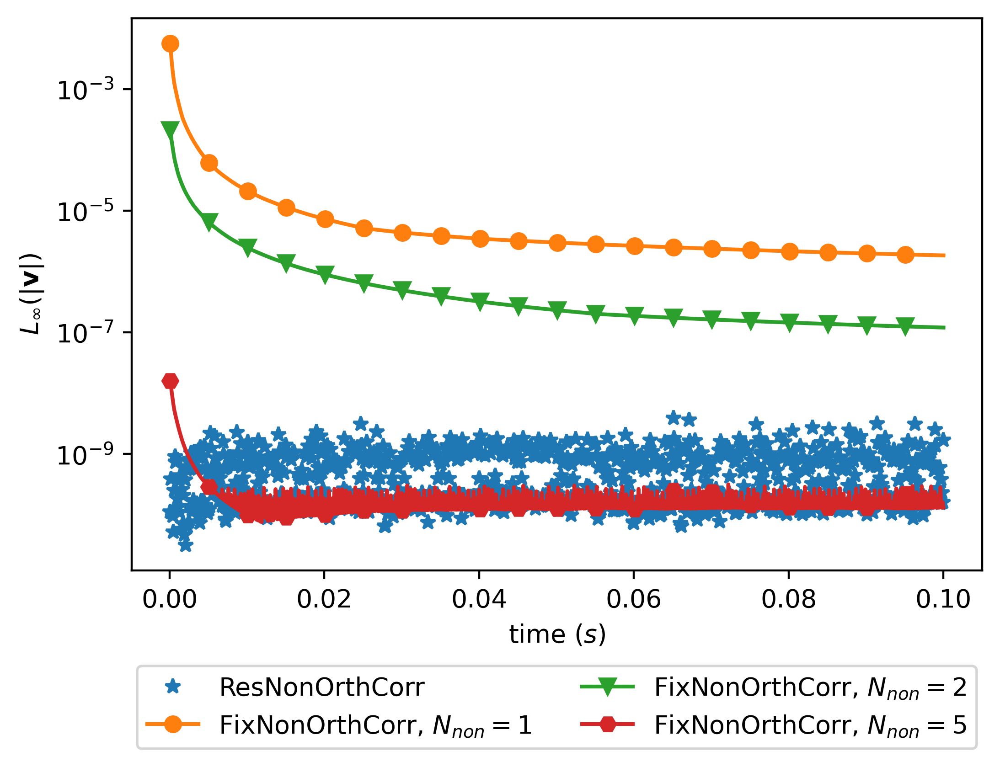

In [29]:
dfN90_ERCNOC = dframe_magU.loc[('ERCNOC','perturbMesh',90),:]
dfN90_PIMPLE1 = dframe_magU.loc[('PIMPLE','perturbMesh',90),:]
dfN90_PIMPLE2 = dframe_magNnon.loc[(1,'perturbMesh',90),:]
dfN90_PIMPLE5 = dframe_magNnon.loc[(4,'perturbMesh',90),:]
dfN90_PIMPLE10 = dframe_magNnon.loc[(9,'perturbMesh',90),:]
#['o', 'v', '^', '<', '>', 's', 'p', '*', 'h', 'H', '+', 'x', 'D', 'd', '|', '_']
plt.plot(dfN90_ERCNOC["Time"],dfN90_ERCNOC["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr") #, marker='+',markevery=50)
plt.plot(dfN90_PIMPLE1["Time"],dfN90_PIMPLE1["max(U)"], label=r"FixNonOrthCorr, $N_{non}=1$", marker='o',markevery=50)
plt.plot(dfN90_PIMPLE2["Time"],dfN90_PIMPLE2["max(U)"], label=r"FixNonOrthCorr, $N_{non}=2$", marker='v',markevery=50)
plt.plot(dfN90_PIMPLE5["Time"],dfN90_PIMPLE5["max(U)"], label=r"FixNonOrthCorr, $N_{non}=5$", marker='H',markevery=50)
#plt.plot(dfN90_PIMPLE10["Time"],dfN90_PIMPLE10["max(U)"], label=r"FixNonOrthCorr, $N_{non}=10$", marker='*',markevery=1,
         #markerfacecolor="None",
#         markeredgecolor='red', 
#         markeredgewidth=0.2, 
#         linestyle='None',
#         alpha=0.5)

#plt.title("static sphere; %s" % (Type))
#plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15),
#      fancybox=True, shadow=True, ncol=1)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.yscale("log")
plt.xlabel(r"time $(s)$")
plt.ylabel(r"$L_{\infty}(|\mathbf{v}|)$")
plt.show()

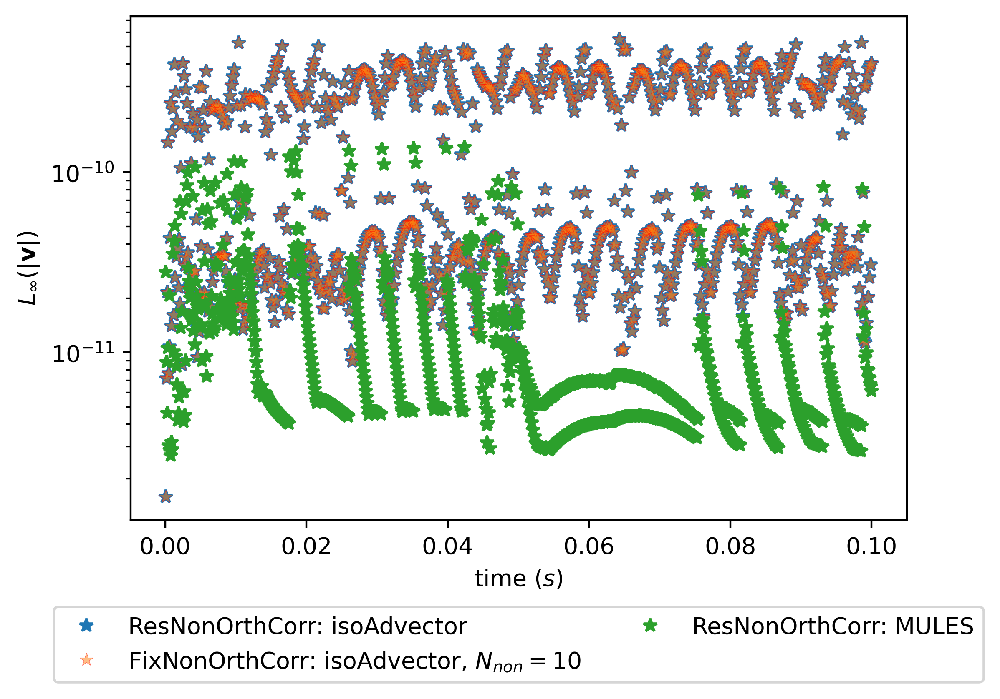

In [44]:
dfN30_ERCNOC = dframe_magU.loc[('ERCNOC','perturbMesh',30),:]
dfN30_PIMPLE10 = dframe_magNnon.loc[(9,'perturbMesh',30),:]

dfN30_ERCNOC_testMULES = dframe_magU_testMULES.loc[('perturbMesh',30),:]



plt.plot(dfN30_ERCNOC["Time"],dfN30_ERCNOC["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: isoAdvector")
plt.plot(dfN30_PIMPLE10["Time"],dfN30_PIMPLE10["max(U)"], label=r"FixNonOrthCorr: isoAdvector, $N_{non}=10$", marker='*',markevery=1,
         #markerfacecolor="None",
         markeredgecolor='red', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.plot(dfN30_ERCNOC_testMULES["Time"],dfN30_ERCNOC_testMULES["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: MULES")

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.yscale("log")
plt.xlabel(r"time $(s)$")
plt.ylabel(r"$L_{\infty}(|\mathbf{v}|)$")
plt.show()

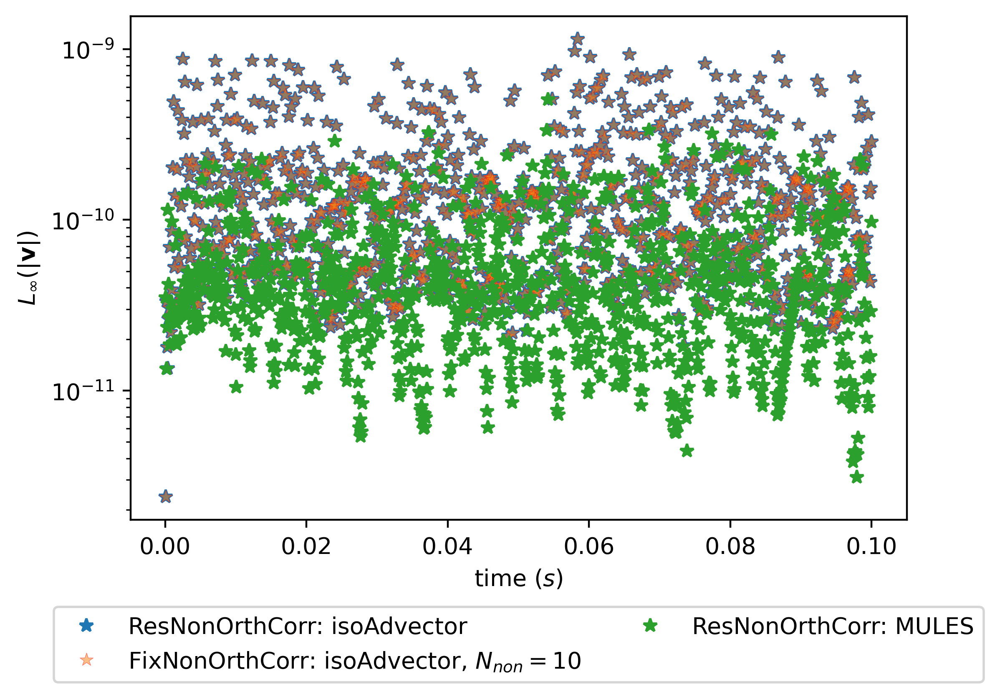

In [45]:
dfN30_ERCNOC = dframe_magU.loc[('ERCNOC','perturbMesh',60),:]
dfN30_PIMPLE10 = dframe_magNnon.loc[(9,'perturbMesh',60),:]

dfN30_ERCNOC_testMULES = dframe_magU_testMULES.loc[('perturbMesh',60),:]



plt.plot(dfN30_ERCNOC["Time"],dfN30_ERCNOC["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: isoAdvector")
plt.plot(dfN30_PIMPLE10["Time"],dfN30_PIMPLE10["max(U)"], label=r"FixNonOrthCorr: isoAdvector, $N_{non}=10$", marker='*',markevery=1,
         #markerfacecolor="None",
         markeredgecolor='red', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.plot(dfN30_ERCNOC_testMULES["Time"],dfN30_ERCNOC_testMULES["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: MULES")

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.yscale("log")
plt.xlabel(r"time $(s)$")
plt.ylabel(r"$L_{\infty}(|\mathbf{v}|)$")
plt.show()

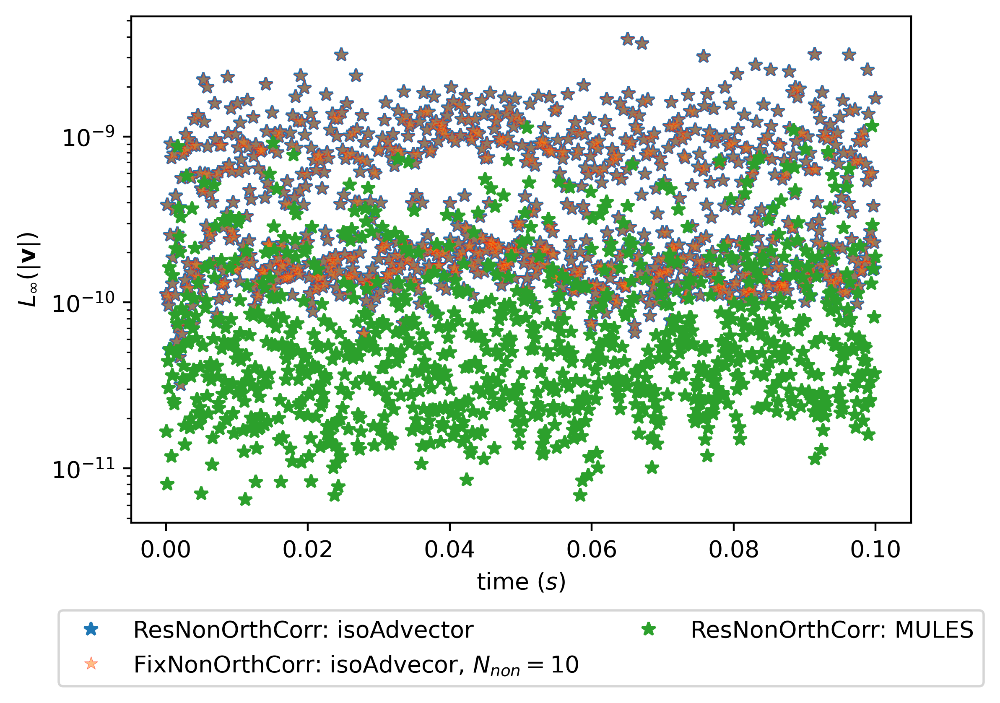

In [46]:
dfN30_ERCNOC = dframe_magU.loc[('ERCNOC','perturbMesh',90),:]
dfN30_PIMPLE10 = dframe_magNnon.loc[(9,'perturbMesh',90),:]

dfN30_ERCNOC_testMULES = dframe_magU_testMULES.loc[('perturbMesh',90),:]



plt.plot(dfN30_ERCNOC["Time"],dfN30_ERCNOC["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: isoAdvector")
plt.plot(dfN30_PIMPLE10["Time"],dfN30_PIMPLE10["max(U)"], label=r"FixNonOrthCorr: isoAdvecor, $N_{non}=10$", marker='*',markevery=1,
         #markerfacecolor="None",
         markeredgecolor='red', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.plot(dfN30_ERCNOC_testMULES["Time"],dfN30_ERCNOC_testMULES["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: MULES")

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.yscale("log")
plt.xlabel(r"time $(s)$")
plt.ylabel(r"$L_{\infty}(|\mathbf{v}|)$")
plt.show()

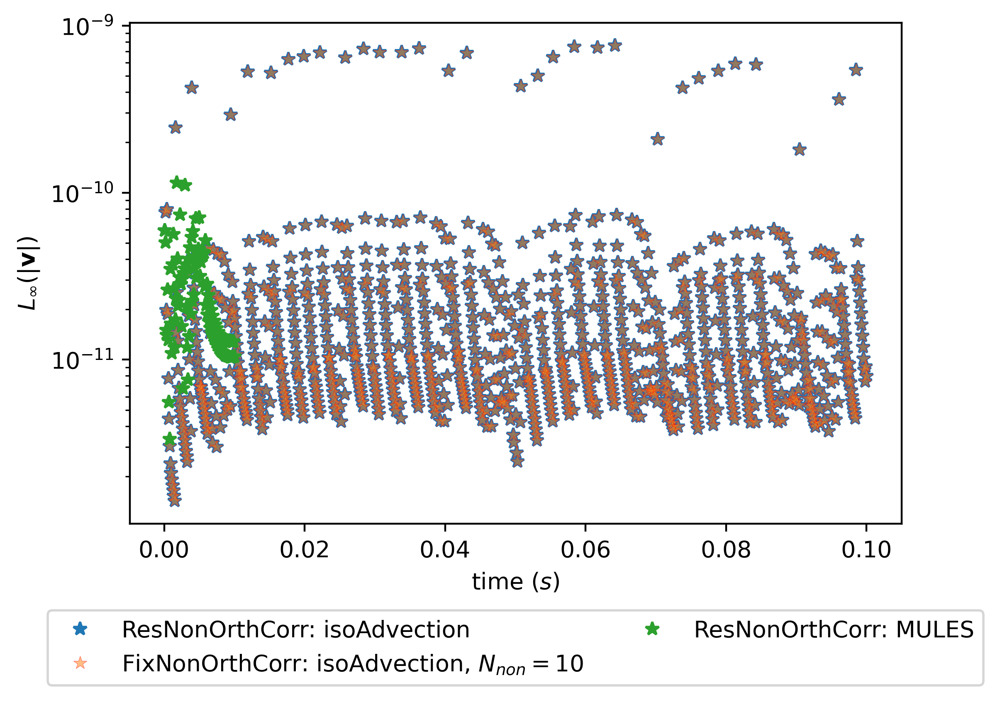

In [27]:
dfN30_ERCNOC = dframe_magU.loc[('ERCNOC','blockMesh',90),:]
dfN30_PIMPLE10 = dframe_magNnon.loc[(9,'blockMesh',90),:]

dfN30_ERCNOC_testMULES = dframe_magU_testMULES.loc[('blockMesh',90),:]



plt.plot(dfN30_ERCNOC["Time"],dfN30_ERCNOC["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: isoAdvection")
plt.plot(dfN30_PIMPLE10["Time"],dfN30_PIMPLE10["max(U)"], label=r"FixNonOrthCorr: isoAdvection, $N_{non}=10$", marker='*',markevery=1,
         #markerfacecolor="None",
         markeredgecolor='red', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.plot(dfN30_ERCNOC_testMULES["Time"],dfN30_ERCNOC_testMULES["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: MULES")

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.yscale("log")
plt.xlabel(r"time $(s)$")
plt.ylabel(r"$L_{\infty}(|\mathbf{v}|)$")
plt.show()

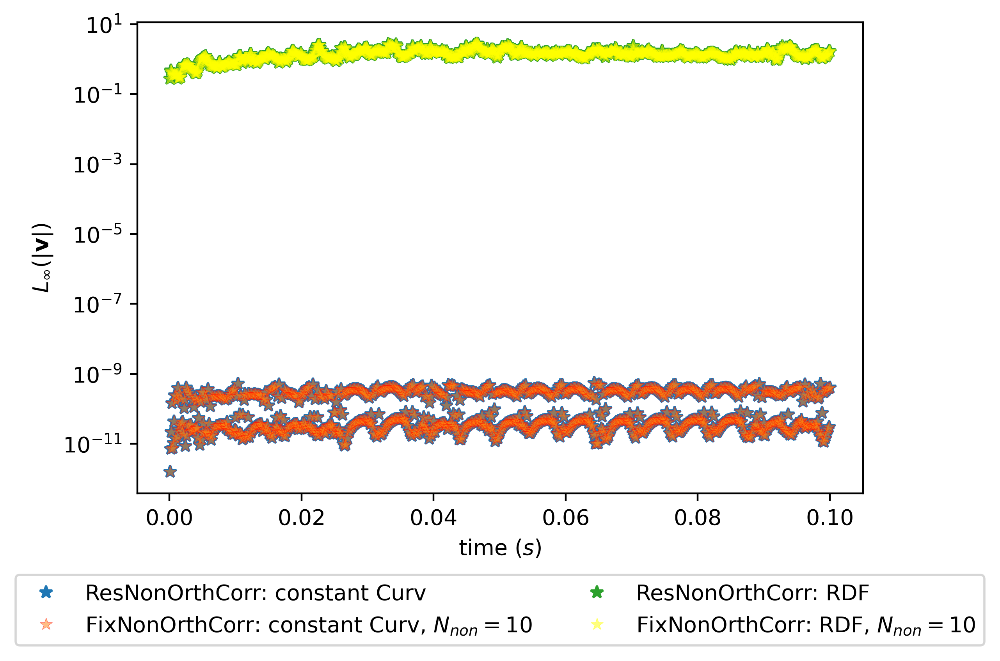

In [9]:
dfN30_ERCNOC = dframe_magU.loc[('ERCNOC','perturbMesh',30),:]
dfN30_PIMPLE10 = dframe_magNnon.loc[(9,'perturbMesh',30),:]

dfN30_ERCNOC_testCurvModel = dframe_magU_testCurvModel.loc[('ERCNOC','perturbMesh',30),:]
dfN30_PIMPLE10_testCurvModel = dframe_magNnon_testCurvModel.loc[(9,'perturbMesh',30),:]


plt.plot(dfN30_ERCNOC["Time"],dfN30_ERCNOC["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: constant Curv")
plt.plot(dfN30_PIMPLE10["Time"],dfN30_PIMPLE10["max(U)"], label=r"FixNonOrthCorr: constant Curv, $N_{non}=10$", marker='*',markevery=1,
         #markerfacecolor="None",
         markeredgecolor='red', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.plot(dfN30_ERCNOC_testCurvModel["Time"],dfN30_ERCNOC_testCurvModel["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: RDF")
plt.plot(dfN30_PIMPLE10_testCurvModel["Time"],dfN30_PIMPLE10_testCurvModel["max(U)"], label=r"FixNonOrthCorr: RDF, $N_{non}=10$", marker='*',markevery=1,
         markerfacecolor="yellow",
         markeredgecolor='yellow', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.yscale("log")
plt.xlabel(r"time $(s)$")
plt.ylabel(r"$L_{\infty}(|\mathbf{v}|)$")
plt.show()

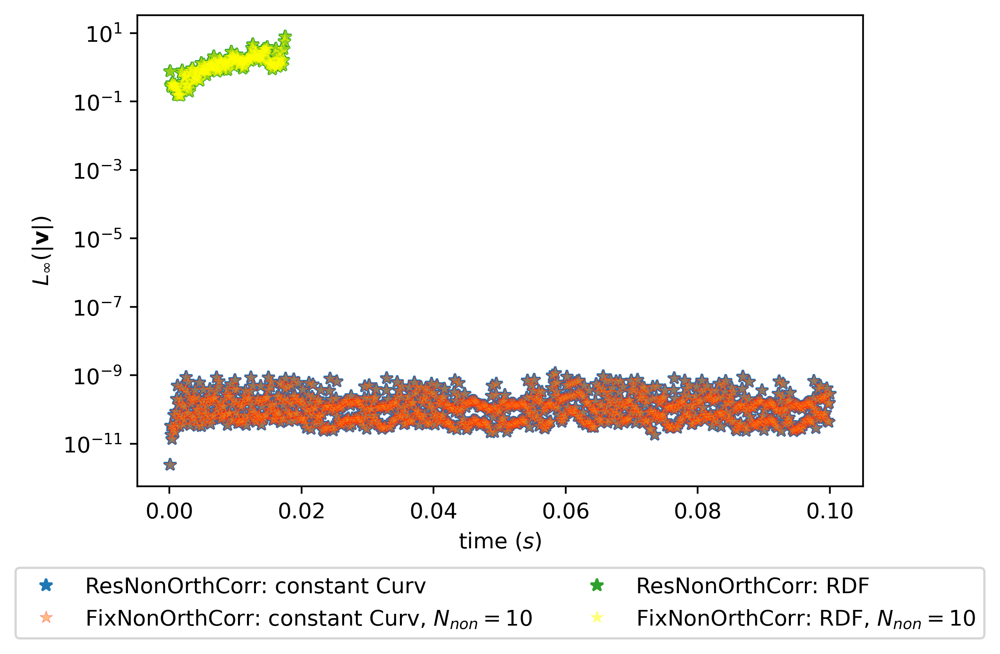

In [10]:
dfN30_ERCNOC = dframe_magU.loc[('ERCNOC','perturbMesh',60),:]
dfN30_PIMPLE10 = dframe_magNnon.loc[(9,'perturbMesh',60),:]

dfN30_ERCNOC_testCurvModel = dframe_magU_testCurvModel.loc[('ERCNOC','perturbMesh',60),:]
dfN30_PIMPLE10_testCurvModel = dframe_magNnon_testCurvModel.loc[(9,'perturbMesh',60),:]


plt.plot(dfN30_ERCNOC["Time"],dfN30_ERCNOC["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: constant Curv")
plt.plot(dfN30_PIMPLE10["Time"],dfN30_PIMPLE10["max(U)"], label=r"FixNonOrthCorr: constant Curv, $N_{non}=10$", marker='*',markevery=1,
         #markerfacecolor="None",
         markeredgecolor='red', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.plot(dfN30_ERCNOC_testCurvModel["Time"],dfN30_ERCNOC_testCurvModel["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: RDF")
plt.plot(dfN30_PIMPLE10_testCurvModel["Time"],dfN30_PIMPLE10_testCurvModel["max(U)"], label=r"FixNonOrthCorr: RDF, $N_{non}=10$", marker='*',markevery=1,
         markerfacecolor="yellow",
         markeredgecolor='yellow', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.yscale("log")
plt.xlabel(r"time $(s)$")
plt.ylabel(r"$L_{\infty}(|\mathbf{v}|)$")
plt.show()

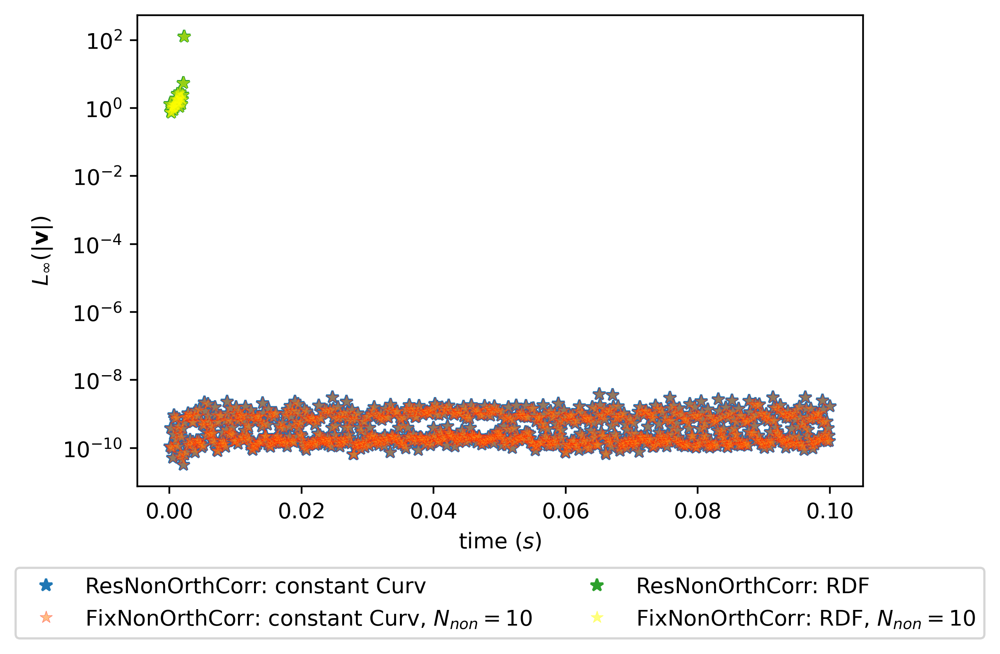

In [11]:
dfN30_ERCNOC = dframe_magU.loc[('ERCNOC','perturbMesh',90),:]
dfN30_PIMPLE10 = dframe_magNnon.loc[(9,'perturbMesh',90),:]

dfN30_ERCNOC_testCurvModel = dframe_magU_testCurvModel.loc[('ERCNOC','perturbMesh',90),:]
dfN30_PIMPLE10_testCurvModel = dframe_magNnon_testCurvModel.loc[(9,'perturbMesh',90),:]


plt.plot(dfN30_ERCNOC["Time"],dfN30_ERCNOC["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: constant Curv")
plt.plot(dfN30_PIMPLE10["Time"],dfN30_PIMPLE10["max(U)"], label=r"FixNonOrthCorr: constant Curv, $N_{non}=10$", marker='*',markevery=1,
         #markerfacecolor="None",
         markeredgecolor='red', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.plot(dfN30_ERCNOC_testCurvModel["Time"],dfN30_ERCNOC_testCurvModel["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: RDF")
plt.plot(dfN30_PIMPLE10_testCurvModel["Time"],dfN30_PIMPLE10_testCurvModel["max(U)"], label=r"FixNonOrthCorr: RDF, $N_{non}=10$", marker='*',markevery=1,
         markerfacecolor="yellow",
         markeredgecolor='yellow', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.yscale("log")
plt.xlabel(r"time $(s)$")
plt.ylabel(r"$L_{\infty}(|\mathbf{v}|)$")
plt.show()

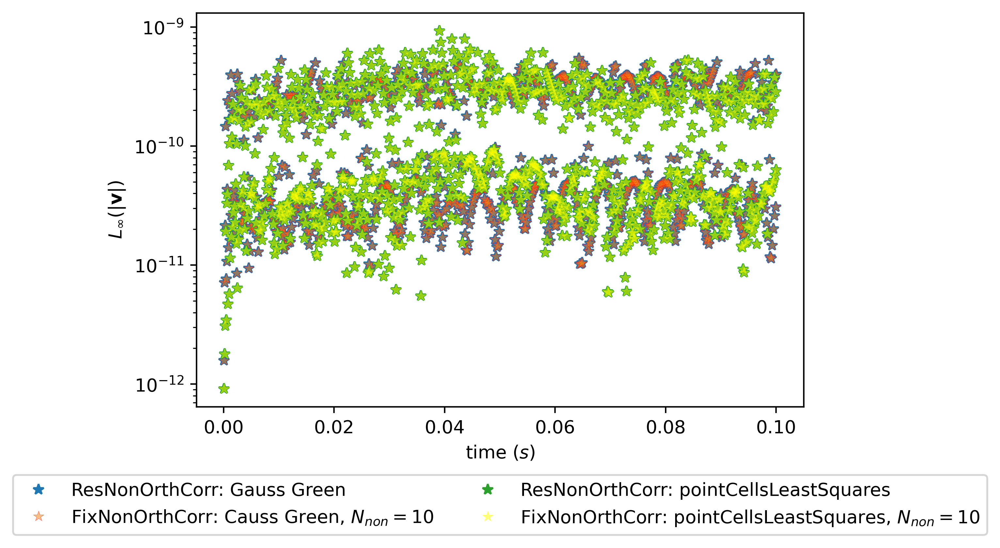

In [20]:
dfN30_ERCNOC = dframe_magU.loc[('ERCNOC','perturbMesh',30),:]
dfN30_PIMPLE10 = dframe_magNnon.loc[(9,'perturbMesh',30),:]

dfN30_ERCNOC_testLeastSquares = dframe_magU_testLeastSquares.loc[('ERCNOC','perturbMesh',30),:]
dfN30_PIMPLE10_testLeastSquares = dframe_magNnon_testLeastSquares.loc[(9,'perturbMesh',30),:]


plt.plot(dfN30_ERCNOC["Time"],dfN30_ERCNOC["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: Gauss Green")
plt.plot(dfN30_PIMPLE10["Time"],dfN30_PIMPLE10["max(U)"], label=r"FixNonOrthCorr: Causs Green, $N_{non}=10$", marker='*',markevery=1,
         #markerfacecolor="None",
         markeredgecolor='red', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.plot(dfN30_ERCNOC_testLeastSquares["Time"],dfN30_ERCNOC_testLeastSquares["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: pointCellsLeastSquares")
plt.plot(dfN30_PIMPLE10_testLeastSquares["Time"],dfN30_PIMPLE10_testLeastSquares["max(U)"], label=r"FixNonOrthCorr: pointCellsLeastSquares, $N_{non}=10$", marker='*',markevery=1,
         markerfacecolor="yellow",
         markeredgecolor='yellow', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.yscale("log")
plt.xlabel(r"time $(s)$")
plt.ylabel(r"$L_{\infty}(|\mathbf{v}|)$")
plt.show()

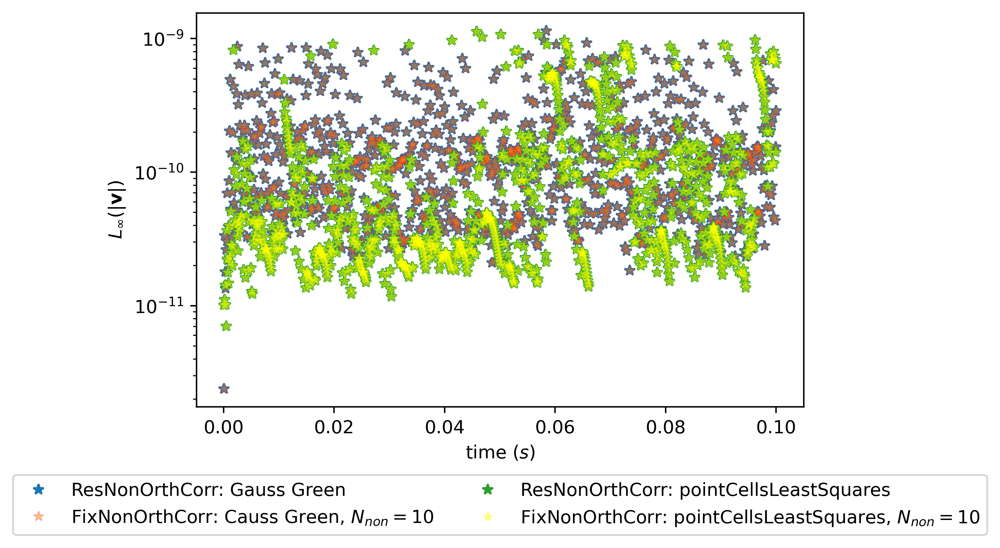

In [21]:
dfN30_ERCNOC = dframe_magU.loc[('ERCNOC','perturbMesh',60),:]
dfN30_PIMPLE10 = dframe_magNnon.loc[(9,'perturbMesh',60),:]

dfN30_ERCNOC_testLeastSquares = dframe_magU_testLeastSquares.loc[('ERCNOC','perturbMesh',60),:]
dfN30_PIMPLE10_testLeastSquares = dframe_magNnon_testLeastSquares.loc[(9,'perturbMesh',60),:]


plt.plot(dfN30_ERCNOC["Time"],dfN30_ERCNOC["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: Gauss Green")
plt.plot(dfN30_PIMPLE10["Time"],dfN30_PIMPLE10["max(U)"], label=r"FixNonOrthCorr: Causs Green, $N_{non}=10$", marker='*',markevery=1,
         #markerfacecolor="None",
         markeredgecolor='red', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.plot(dfN30_ERCNOC_testLeastSquares["Time"],dfN30_ERCNOC_testLeastSquares["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: pointCellsLeastSquares")
plt.plot(dfN30_PIMPLE10_testLeastSquares["Time"],dfN30_PIMPLE10_testLeastSquares["max(U)"], label=r"FixNonOrthCorr: pointCellsLeastSquares, $N_{non}=10$", marker='*',markevery=1,
         markerfacecolor="yellow",
         markeredgecolor='yellow', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.yscale("log")
plt.xlabel(r"time $(s)$")
plt.ylabel(r"$L_{\infty}(|\mathbf{v}|)$")
plt.show()

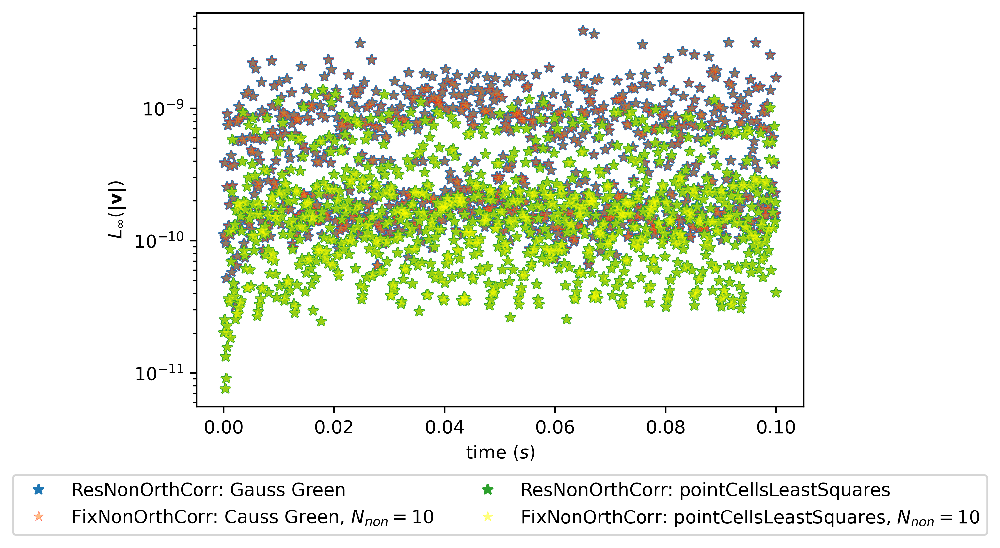

In [22]:
dfN30_ERCNOC = dframe_magU.loc[('ERCNOC','perturbMesh',90),:]
dfN30_PIMPLE10 = dframe_magNnon.loc[(9,'perturbMesh',90),:]

dfN30_ERCNOC_testLeastSquares = dframe_magU_testLeastSquares.loc[('ERCNOC','perturbMesh',90),:]
dfN30_PIMPLE10_testLeastSquares = dframe_magNnon_testLeastSquares.loc[(9,'perturbMesh',90),:]


plt.plot(dfN30_ERCNOC["Time"],dfN30_ERCNOC["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: Gauss Green")
plt.plot(dfN30_PIMPLE10["Time"],dfN30_PIMPLE10["max(U)"], label=r"FixNonOrthCorr: Causs Green, $N_{non}=10$", marker='*',markevery=1,
         #markerfacecolor="None",
         markeredgecolor='red', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.plot(dfN30_ERCNOC_testLeastSquares["Time"],dfN30_ERCNOC_testLeastSquares["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: pointCellsLeastSquares")
plt.plot(dfN30_PIMPLE10_testLeastSquares["Time"],dfN30_PIMPLE10_testLeastSquares["max(U)"], label=r"FixNonOrthCorr: pointCellsLeastSquares, $N_{non}=10$", marker='*',markevery=1,
         markerfacecolor="yellow",
         markeredgecolor='yellow', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.yscale("log")
plt.xlabel(r"time $(s)$")
plt.ylabel(r"$L_{\infty}(|\mathbf{v}|)$")
plt.show()

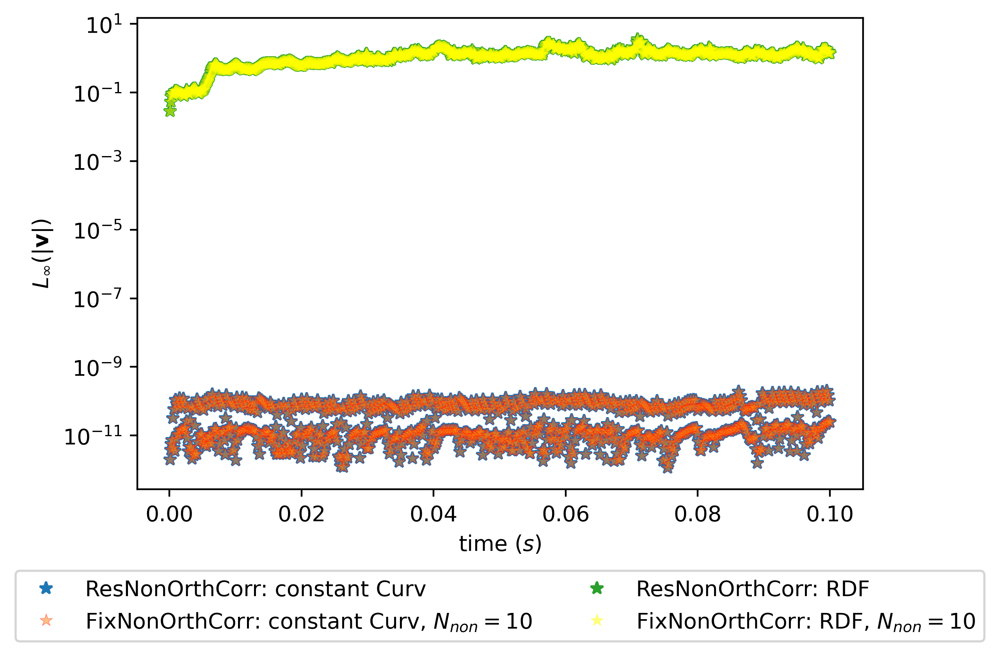

In [12]:
dfN30_ERCNOC = dframe_magU.loc[('ERCNOC','blockMesh',30),:]
dfN30_PIMPLE10 = dframe_magNnon.loc[(9,'blockMesh',30),:]

dfN30_ERCNOC_testCurvModel = dframe_magU_testCurvModel.loc[('ERCNOC','blockMesh',30),:]
dfN30_PIMPLE10_testCurvModel = dframe_magNnon_testCurvModel.loc[(9,'blockMesh',30),:]


plt.plot(dfN30_ERCNOC["Time"],dfN30_ERCNOC["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: constant Curv")
plt.plot(dfN30_PIMPLE10["Time"],dfN30_PIMPLE10["max(U)"], label=r"FixNonOrthCorr: constant Curv, $N_{non}=10$", marker='*',markevery=1,
         #markerfacecolor="None",
         markeredgecolor='red', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.plot(dfN30_ERCNOC_testCurvModel["Time"],dfN30_ERCNOC_testCurvModel["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: RDF")
plt.plot(dfN30_PIMPLE10_testCurvModel["Time"],dfN30_PIMPLE10_testCurvModel["max(U)"], label=r"FixNonOrthCorr: RDF, $N_{non}=10$", marker='*',markevery=1,
         markerfacecolor="yellow",
         markeredgecolor='yellow', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.yscale("log")
plt.xlabel(r"time $(s)$")
plt.ylabel(r"$L_{\infty}(|\mathbf{v}|)$")
plt.show()

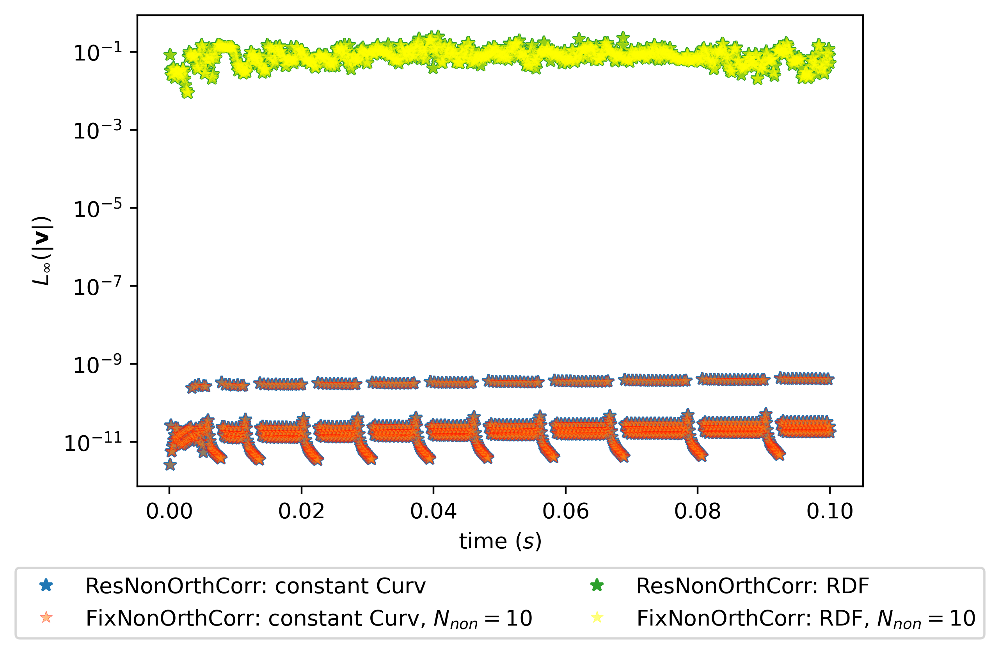

In [13]:
dfN30_ERCNOC = dframe_magU.loc[('ERCNOC','blockMesh',60),:]
dfN30_PIMPLE10 = dframe_magNnon.loc[(9,'blockMesh',60),:]

dfN30_ERCNOC_testCurvModel = dframe_magU_testCurvModel.loc[('ERCNOC','blockMesh',60),:]
dfN30_PIMPLE10_testCurvModel = dframe_magNnon_testCurvModel.loc[(9,'blockMesh',60),:]


plt.plot(dfN30_ERCNOC["Time"],dfN30_ERCNOC["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: constant Curv")
plt.plot(dfN30_PIMPLE10["Time"],dfN30_PIMPLE10["max(U)"], label=r"FixNonOrthCorr: constant Curv, $N_{non}=10$", marker='*',markevery=1,
         #markerfacecolor="None",
         markeredgecolor='red', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.plot(dfN30_ERCNOC_testCurvModel["Time"],dfN30_ERCNOC_testCurvModel["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: RDF")
plt.plot(dfN30_PIMPLE10_testCurvModel["Time"],dfN30_PIMPLE10_testCurvModel["max(U)"], label=r"FixNonOrthCorr: RDF, $N_{non}=10$", marker='*',markevery=1,
         markerfacecolor="yellow",
         markeredgecolor='yellow', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.yscale("log")
plt.xlabel(r"time $(s)$")
plt.ylabel(r"$L_{\infty}(|\mathbf{v}|)$")
plt.show()

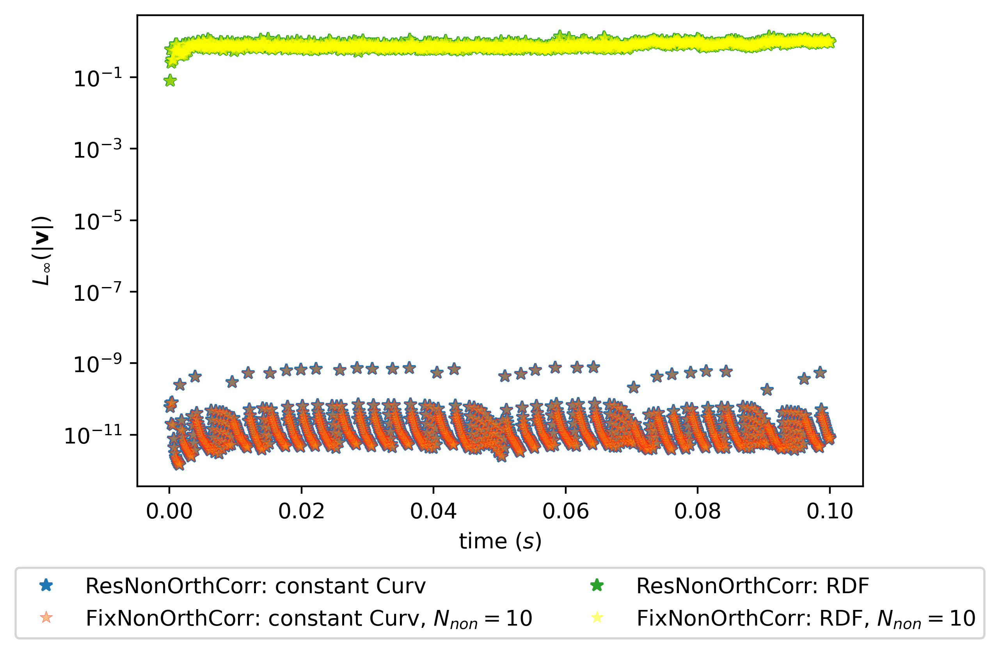

In [14]:
dfN30_ERCNOC = dframe_magU.loc[('ERCNOC','blockMesh',90),:]
dfN30_PIMPLE10 = dframe_magNnon.loc[(9,'blockMesh',90),:]

dfN30_ERCNOC_testCurvModel = dframe_magU_testCurvModel.loc[('ERCNOC','blockMesh',90),:]
dfN30_PIMPLE10_testCurvModel = dframe_magNnon_testCurvModel.loc[(9,'blockMesh',90),:]


plt.plot(dfN30_ERCNOC["Time"],dfN30_ERCNOC["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: constant Curv")
plt.plot(dfN30_PIMPLE10["Time"],dfN30_PIMPLE10["max(U)"], label=r"FixNonOrthCorr: constant Curv, $N_{non}=10$", marker='*',markevery=1,
         #markerfacecolor="None",
         markeredgecolor='red', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.plot(dfN30_ERCNOC_testCurvModel["Time"],dfN30_ERCNOC_testCurvModel["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: RDF")
plt.plot(dfN30_PIMPLE10_testCurvModel["Time"],dfN30_PIMPLE10_testCurvModel["max(U)"], label=r"FixNonOrthCorr: RDF, $N_{non}=10$", marker='*',markevery=1,
         markerfacecolor="yellow",
         markeredgecolor='yellow', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.yscale("log")
plt.xlabel(r"time $(s)$")
plt.ylabel(r"$L_{\infty}(|\mathbf{v}|)$")
plt.show()

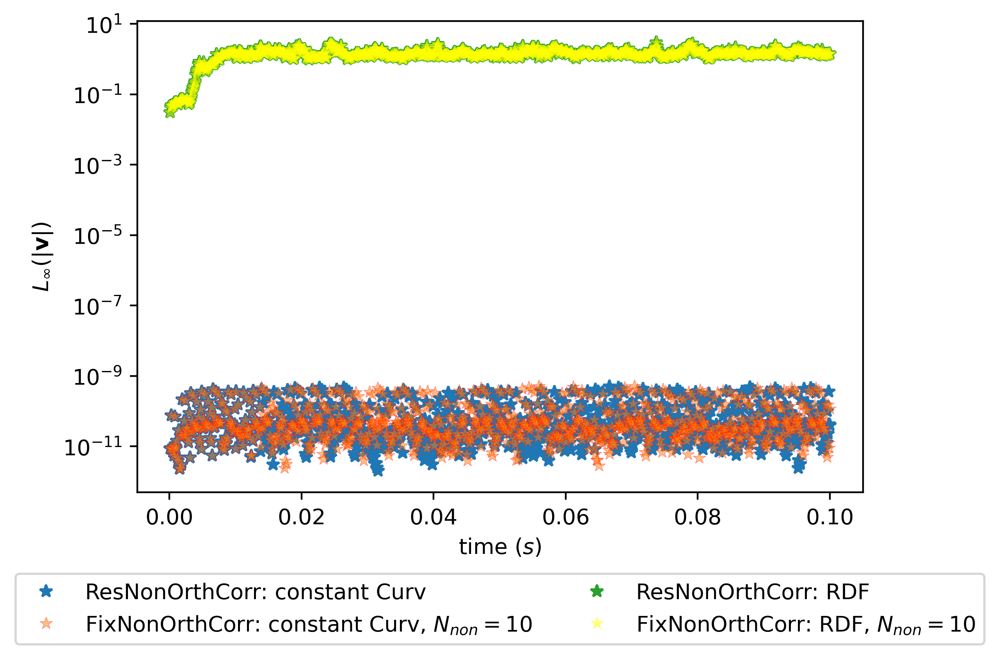

In [15]:
dfN30_ERCNOC = dframe_magU.loc[('ERCNOC','polyMesh',30),:]
dfN30_PIMPLE10 = dframe_magNnon.loc[(9,'polyMesh',30),:]

dfN30_ERCNOC_testCurvModel = dframe_magU_testCurvModel.loc[('ERCNOC','polyMesh',30),:]
dfN30_PIMPLE10_testCurvModel = dframe_magNnon_testCurvModel.loc[(9,'polyMesh',30),:]


plt.plot(dfN30_ERCNOC["Time"],dfN30_ERCNOC["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: constant Curv")
plt.plot(dfN30_PIMPLE10["Time"],dfN30_PIMPLE10["max(U)"], label=r"FixNonOrthCorr: constant Curv, $N_{non}=10$", marker='*',markevery=1,
         #markerfacecolor="None",
         markeredgecolor='red', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.plot(dfN30_ERCNOC_testCurvModel["Time"],dfN30_ERCNOC_testCurvModel["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: RDF")
plt.plot(dfN30_PIMPLE10_testCurvModel["Time"],dfN30_PIMPLE10_testCurvModel["max(U)"], label=r"FixNonOrthCorr: RDF, $N_{non}=10$", marker='*',markevery=1,
         markerfacecolor="yellow",
         markeredgecolor='yellow', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.yscale("log")
plt.xlabel(r"time $(s)$")
plt.ylabel(r"$L_{\infty}(|\mathbf{v}|)$")
plt.show()

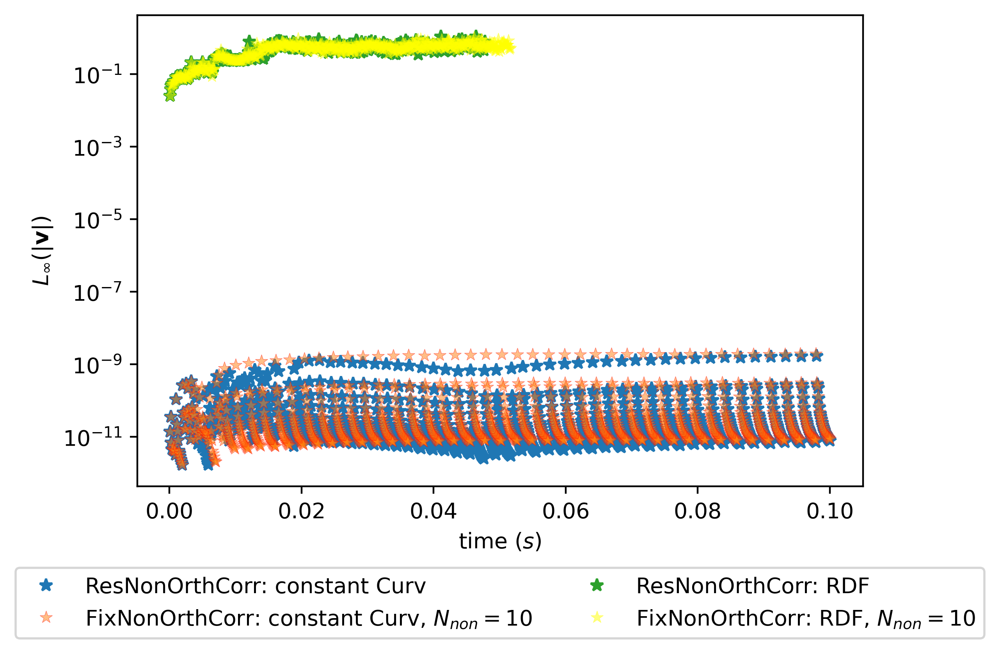

In [16]:
dfN30_ERCNOC = dframe_magU.loc[('ERCNOC','polyMesh',60),:]
dfN30_PIMPLE10 = dframe_magNnon.loc[(9,'polyMesh',60),:]

dfN30_ERCNOC_testCurvModel = dframe_magU_testCurvModel.loc[('ERCNOC','polyMesh',60),:]
dfN30_PIMPLE10_testCurvModel = dframe_magNnon_testCurvModel.loc[(9,'polyMesh',60),:]


plt.plot(dfN30_ERCNOC["Time"],dfN30_ERCNOC["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: constant Curv")
plt.plot(dfN30_PIMPLE10["Time"],dfN30_PIMPLE10["max(U)"], label=r"FixNonOrthCorr: constant Curv, $N_{non}=10$", marker='*',markevery=1,
         #markerfacecolor="None",
         markeredgecolor='red', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.plot(dfN30_ERCNOC_testCurvModel["Time"],dfN30_ERCNOC_testCurvModel["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: RDF")
plt.plot(dfN30_PIMPLE10_testCurvModel["Time"],dfN30_PIMPLE10_testCurvModel["max(U)"], label=r"FixNonOrthCorr: RDF, $N_{non}=10$", marker='*',markevery=1,
         markerfacecolor="yellow",
         markeredgecolor='yellow', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.yscale("log")
plt.xlabel(r"time $(s)$")
plt.ylabel(r"$L_{\infty}(|\mathbf{v}|)$")
plt.show()

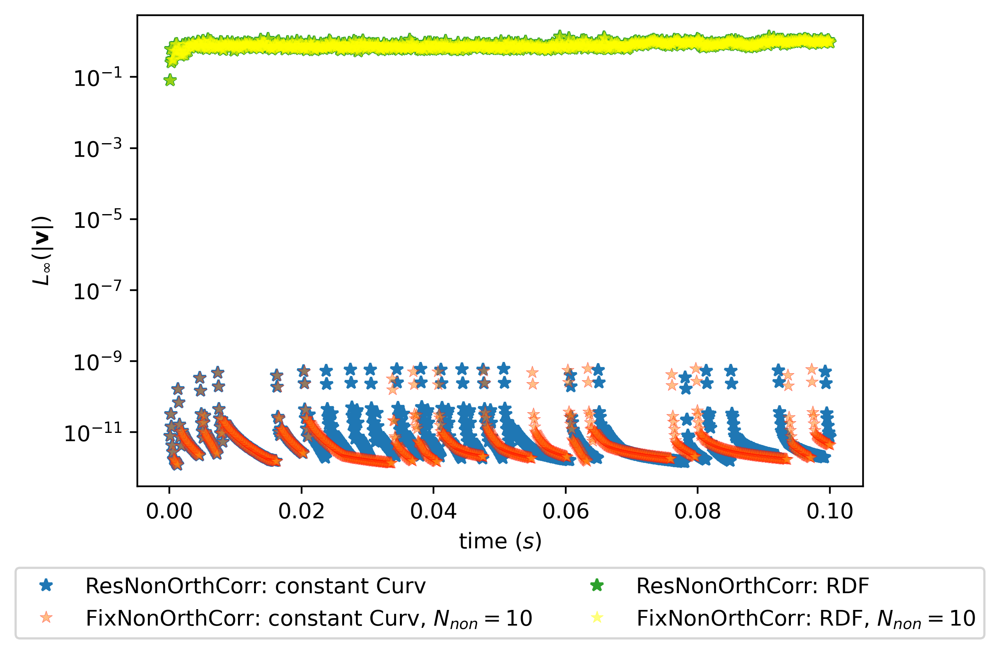

In [17]:
dfN30_ERCNOC = dframe_magU.loc[('ERCNOC','polyMesh',90),:]
dfN30_PIMPLE10 = dframe_magNnon.loc[(9,'polyMesh',90),:]

dfN30_ERCNOC_testCurvModel = dframe_magU_testCurvModel.loc[('ERCNOC','blockMesh',90),:]
dfN30_PIMPLE10_testCurvModel = dframe_magNnon_testCurvModel.loc[(9,'blockMesh',90),:]


plt.plot(dfN30_ERCNOC["Time"],dfN30_ERCNOC["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: constant Curv")
plt.plot(dfN30_PIMPLE10["Time"],dfN30_PIMPLE10["max(U)"], label=r"FixNonOrthCorr: constant Curv, $N_{non}=10$", marker='*',markevery=1,
         #markerfacecolor="None",
         markeredgecolor='red', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.plot(dfN30_ERCNOC_testCurvModel["Time"],dfN30_ERCNOC_testCurvModel["max(U)"], marker='*',linestyle='None',label="ResNonOrthCorr: RDF")
plt.plot(dfN30_PIMPLE10_testCurvModel["Time"],dfN30_PIMPLE10_testCurvModel["max(U)"], label=r"FixNonOrthCorr: RDF, $N_{non}=10$", marker='*',markevery=1,
         markerfacecolor="yellow",
         markeredgecolor='yellow', 
         markeredgewidth=0.2, 
         linestyle='None',
         alpha=0.5)

plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
plt.yscale("log")
plt.xlabel(r"time $(s)$")
plt.ylabel(r"$L_{\infty}(|\mathbf{v}|)$")
plt.show()

In [15]:
dframe_magNnon

Time        min(U)        max(U)  \
nNonOrthog meshType  resolution step                                       
1          blockMesh 30         0     0.0001  6.256407e-16  1.974596e-12   
                                1     0.0002  1.219369e-15  3.871655e-12   
                                2     0.0003  9.924028e-16  5.695124e-12   
                                3     0.0004  1.717437e-16  7.426097e-12   
                                4     0.0005  4.269884e-16  3.219775e-11   
...                                      ...           ...           ...   
9          polyMesh  90         828   0.0829  1.575370e-18  3.906431e-12   
                                829   0.0830  5.007277e-19  3.835405e-12   
                                830   0.0831  2.674050e-19  3.769236e-12   
                                831   0.0832  6.715539e-19  3.704680e-12   
                                832   0.0833  3.422771e-19  3.643556e-12   

                                        min(p_rgh)  max(p_rgh)  
nNonOrthog meshType  resolution step                            
1          blockMesh 30         0     0.000000e+00      145.48  
                                1     0.000000e+00      145.48  
                                2     0.000000e+00      145.48  
                                3    -2.552563e-11      145.48  
                                4    -2.552563e-11      145.48  
...                                            ...         ...  
9          polyMesh  90         828  -7.735733e-12      145.48  
                                829  -7.515889e-12      145.48  
                                830  -7.353835e-12      145.48  
                                831  -7.128930e-12      145.48  
                                832  -6.982897e-12      145.48  

[26821 rows x 5 columns]

In [9]:
agglomerator = da.data_agglomerator("static3DSphere.parameter","postProcessing/maxPrgh/0/fieldMinMax.dat", 
                                     "./InterFlow-static3DSphere_00000_template")
agglomerator.show_failed_variations()
agglomerator.write_agglomerated_study_data("InterFlow_staticSphere_magPrgh.csv")
dframe_magPrgh = agglomerator.study_dataframe()
dframe_magPrgh = dframe_magPrgh.sort_index()
#idx = pd.IndexSlice

Variants without valid data:
----------------------------
#Variation | Reason
----------------------------
[['ERCNOC', 'PIMPLE'], ['blockMesh', 'perturbMesh', 'polyMesh'], [30, 60, 90], [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]]
['nonOrthogControl', 'meshType', 'resolution', 'step']


In [19]:
print_magprgh(dframe_magPrgh)

 ERCNOC blockMesh 30: max(p_rgh): 1.4457014695146388e-14
 PIMPLE blockMesh 30: max(p_rgh): 8.205332664812815e-15
 ERCNOC perturbMesh 30: max(p_rgh): 3.743194615662227e-13
 PIMPLE perturbMesh 30: max(p_rgh): 3.9894034368724737e-10
 ERCNOC polyMesh 30: max(p_rgh): 4.673132317674346e-13
 PIMPLE polyMesh 30: max(p_rgh): 1.6684176418452725e-13
 ERCNOC blockMesh 60: max(p_rgh): 1.7582855710313176e-14
 PIMPLE blockMesh 60: max(p_rgh): 2.8914029390292777e-14
 ERCNOC perturbMesh 60: max(p_rgh): 3.6005781193452424e-13
 PIMPLE perturbMesh 60: max(p_rgh): 4.063390530780964e-09
 ERCNOC polyMesh 60: max(p_rgh): 3.55564415475222e-14
 PIMPLE polyMesh 60: max(p_rgh): 1.2014951402047337e-13
 ERCNOC blockMesh 90: max(p_rgh): 2.383453774064675e-14
 PIMPLE blockMesh 90: max(p_rgh): 2.2076252169615434e-14
 ERCNOC perturbMesh 90: max(p_rgh): 1.8766767994807598e-12
 PIMPLE perturbMesh 90: max(p_rgh): 5.802082353503899e-09
 ERCNOC polyMesh 90: max(p_rgh): 1.6742785937487103e-13
 PIMPLE polyMesh 90: max(p_rgh):

In [7]:
print_magU(dframe_magU)

 ERCNOC blockMesh 30: maxU: 2.45669091275464e-11
 PIMPLE blockMesh 30: maxU: 9.192413487723529e-11
 ERCNOC perturbMesh 30: maxU: 4.01992784827164e-10
 PIMPLE perturbMesh 30: maxU: 2.16825269202589e-07
 ERCNOC polyMesh 30: maxU: 3.96126023362197e-11
 PIMPLE polyMesh 30: maxU: 4.334060908427019e-11
 ERCNOC blockMesh 60: maxU: 1.7331804555783698e-11
 PIMPLE blockMesh 60: maxU: 3.04719684832912e-10
 ERCNOC perturbMesh 60: maxU: 2.87293465837518e-10
 PIMPLE perturbMesh 60: maxU: 1.52529381059252e-06
 ERCNOC polyMesh 60: maxU: 7.79835233664541e-12
 PIMPLE polyMesh 60: maxU: 9.04860975752616e-12
 ERCNOC blockMesh 90: maxU: 7.97758850906141e-12
 PIMPLE blockMesh 90: maxU: 6.06168107487419e-12
 ERCNOC perturbMesh 90: maxU: 1.7006369289162702e-09
 PIMPLE perturbMesh 90: maxU: 1.83976183997101e-06
 ERCNOC polyMesh 90: maxU: 7.36373866023576e-12
 PIMPLE polyMesh 90: maxU: 1.91060855080079e-12


In [9]:
def print_Nnon(dframe):
    meshTypes = dframe.index.get_level_values("meshType").unique()
    resolutions = dframe.index.get_level_values("resolution").unique()
    control = ['PIMPLE']#dframe.index.get_level_values("nonOrthogControl").unique()
    nNons = dframe.index.get_level_values("nNonOrthog").unique()
    #gravityModels = [model]#['gravity', 'gravityDirac', 'gravityRecon']
    #marker_list = list(Line2D.markers.keys()) #['o', 'v', '^', '<', '>', 's', 'p', '*', 'h', 'H', '+', 'x', 'D', 'd', '|', '_']
    #marker_list = ['o', 'v']
    
    for resolution in resolutions:
        #marker = random.choice(marker_list)
        for Type in meshTypes:
            for nNon in nNons:
                df = dframe.loc[(nNon,Type,resolution),:]
                maxU = df["max(U)"].iloc[0]
                maxDelp = (df["max(p_rgh)"].iloc[0]-df["min(p_rgh)"].iloc[0] - 145.48)/145.48
                print(" %s %s %s: maxU: %s, maxDelp: %s" % (nNon, Type, resolution, maxU, maxDelp))
                #plt.plot(df["Time"],df["max(U)"], label="N %s; controlMethod %s" % (resolution, control))#, marker=marker)

    #plt.title("static sphere; %s" % (Type))
    #plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15),
          #fancybox=True, shadow=True, ncol=1)
    #plt.yscale("log")
    #plt.xlabel(r"time $(s)$")
    #plt.ylabel(r"max $(|\mathbf{v}|)$")
    #plt.show()

Variants without valid data:
----------------------------
#Variation | Reason
----------------------------
[[1, 4, 9], ['PIMPLE'], ['blockMesh', 'perturbMesh', 'polyMesh'], [30, 60, 90], [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, ...]]
['nNonOrthog', 'nonOrthogControl', 'meshType', 'resolution', 'step']


In [8]:
print_Nnon(dframe_magNnon)

 1 blockMesh 30: maxU: 2.45669091275464e-11, maxDelp: 4.2687266363371434e-13
 4 blockMesh 30: maxU: 2.45669091275464e-11, maxDelp: 4.2687266363371434e-13
 9 blockMesh 30: maxU: 2.45669091275464e-11, maxDelp: 4.2687266363371434e-13
 1 perturbMesh 30: maxU: 3.818612572769801e-09, maxDelp: 8.75352703284769e-12
 4 perturbMesh 30: maxU: 4.56215223383373e-11, maxDelp: 3.379815597649088e-13
 9 perturbMesh 30: maxU: 4.01992784827164e-10, maxDelp: 7.386753048966013e-13
 1 polyMesh 30: maxU: 1.15118564417363e-10, maxDelp: 9.357986539155568e-14
 4 polyMesh 30: maxU: 1.15118564417363e-10, maxDelp: 9.357986539155568e-14
 9 polyMesh 30: maxU: 1.15118564417363e-10, maxDelp: 9.357986539155568e-14
 1 blockMesh 60: maxU: 1.7331804555783698e-11, maxDelp: 3.145377521511579e-14
 4 blockMesh 60: maxU: 1.7331804555783698e-11, maxDelp: 3.145377521511579e-14
 9 blockMesh 60: maxU: 1.7331804555783698e-11, maxDelp: 3.145377521511579e-14
 1 perturbMesh 60: maxU: 2.92946763646817e-08, maxDelp: 8.560994762819762e-1

In [10]:
print_Nnon(dframe_magNnon)

 1 blockMesh 30: maxU: 1.97459584072791e-12, maxDelp: 2.887495637760319e-13
 4 blockMesh 30: maxU: 1.97459584072791e-12, maxDelp: 2.887495637760319e-13
 9 blockMesh 30: maxU: 1.97459584072791e-12, maxDelp: 2.887495637760319e-13
 1 perturbMesh 30: maxU: 2.4329307718795e-06, maxDelp: 1.3139052672367176e-08
 4 perturbMesh 30: maxU: 3.2880503709451996e-11, maxDelp: 3.5751806610970125e-13
 9 perturbMesh 30: maxU: 1.57559588417663e-12, maxDelp: 2.0493795155687247e-13
 1 polyMesh 30: maxU: 8.59133873553387e-12, maxDelp: 7.080029899352772e-13
 4 polyMesh 30: maxU: 8.59133873553387e-12, maxDelp: 7.080029899352772e-13
 9 polyMesh 30: maxU: 8.59133873553387e-12, maxDelp: 7.080029899352772e-13
 1 blockMesh 60: maxU: 2.55202447095741e-12, maxDelp: 3.2430600532355415e-13
 4 blockMesh 60: maxU: 2.55202447095741e-12, maxDelp: 3.2430600532355415e-13
 9 blockMesh 60: maxU: 2.55202447095741e-12, maxDelp: 3.2430600532355415e-13
 1 perturbMesh 60: maxU: 3.67162620107988e-05, maxDelp: 2.703745716973048e-07


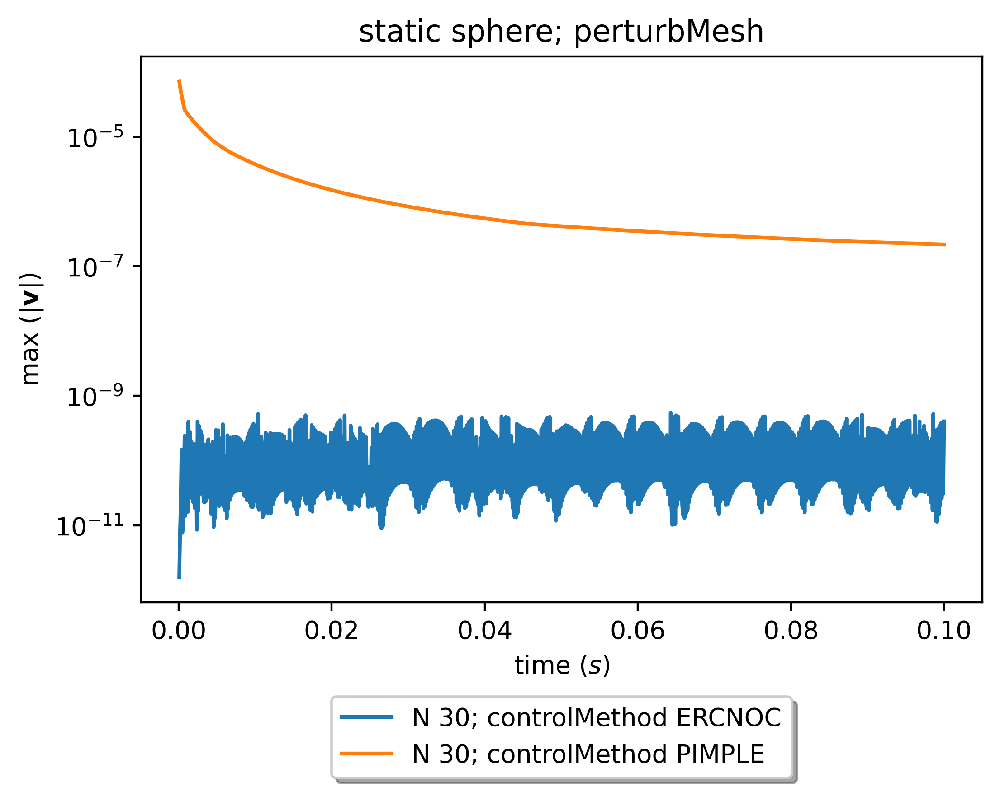

In [37]:
plot_magU(dframe_magU,'perturbMesh',30)

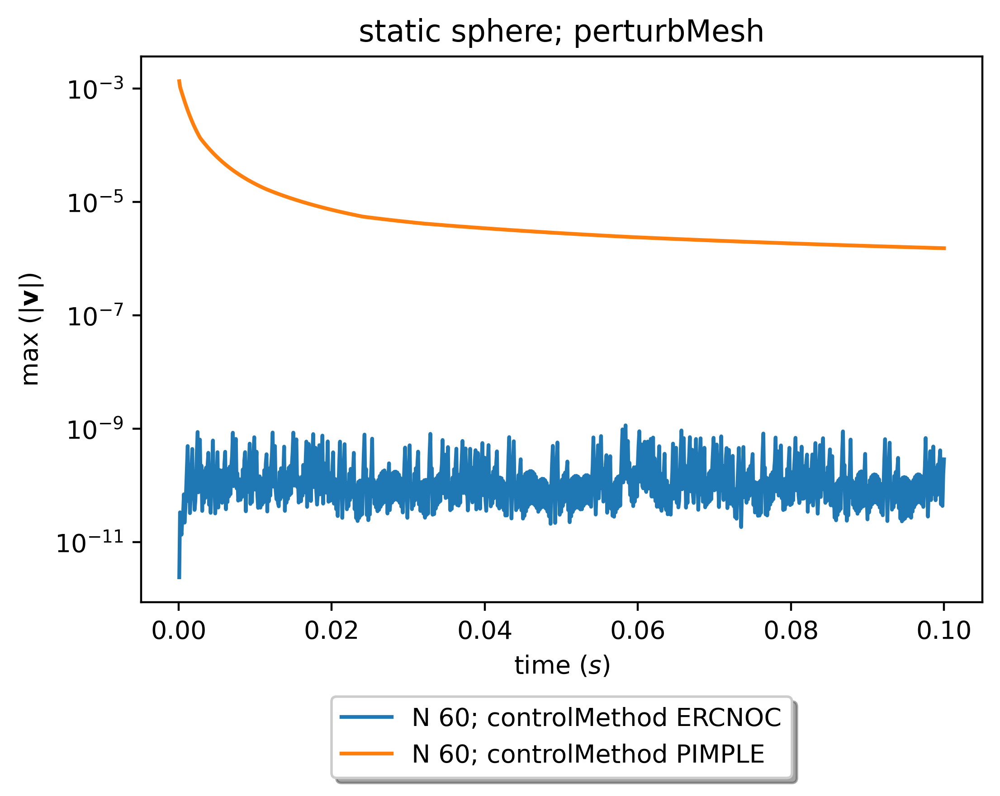

In [21]:
plot_magU(dframe_magU,'perturbMesh',60)

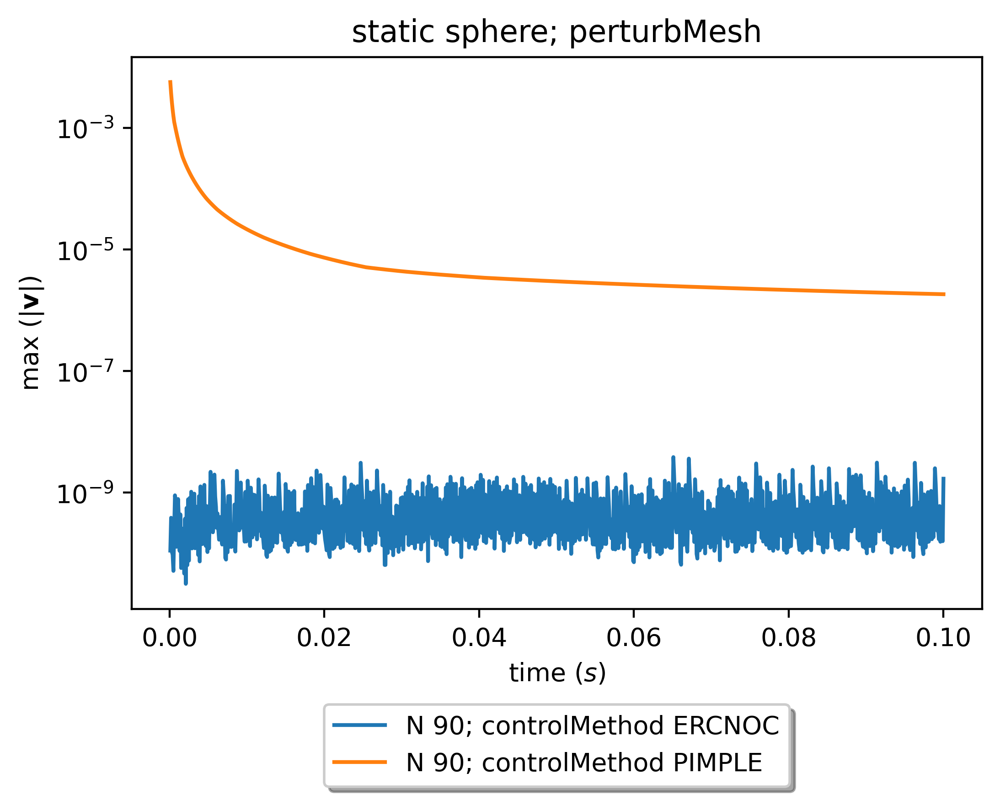

In [22]:
plot_magU(dframe_magU,'perturbMesh',90)

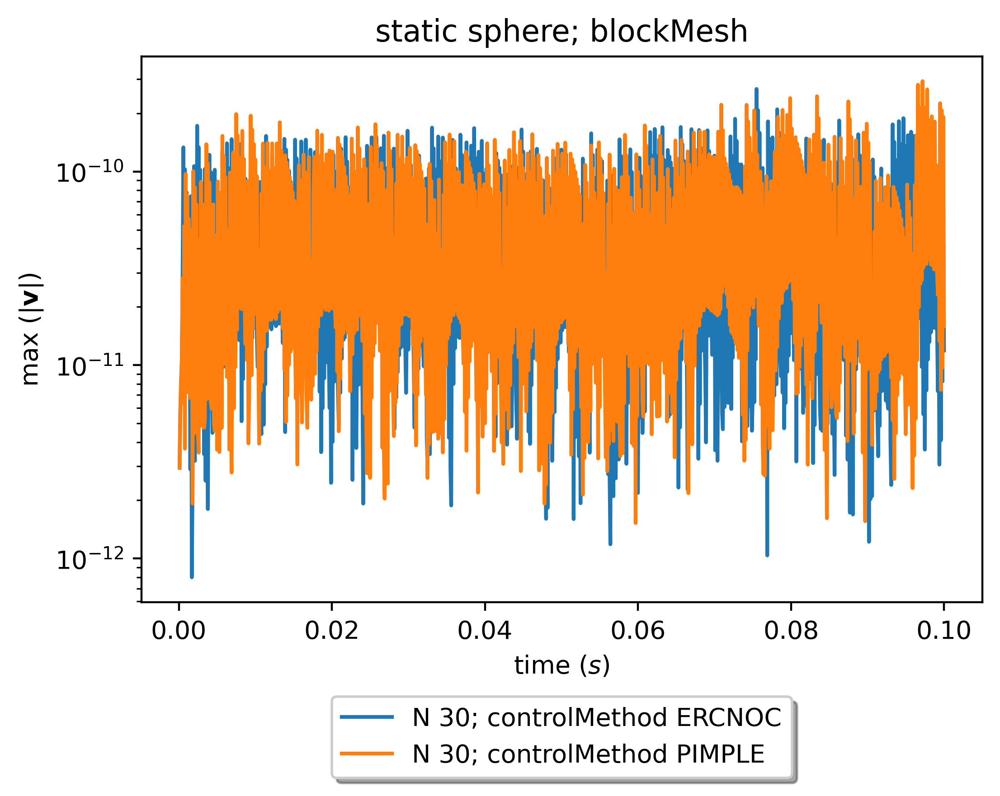

In [16]:
plot_magU(dframe_magU,'blockMesh',30)

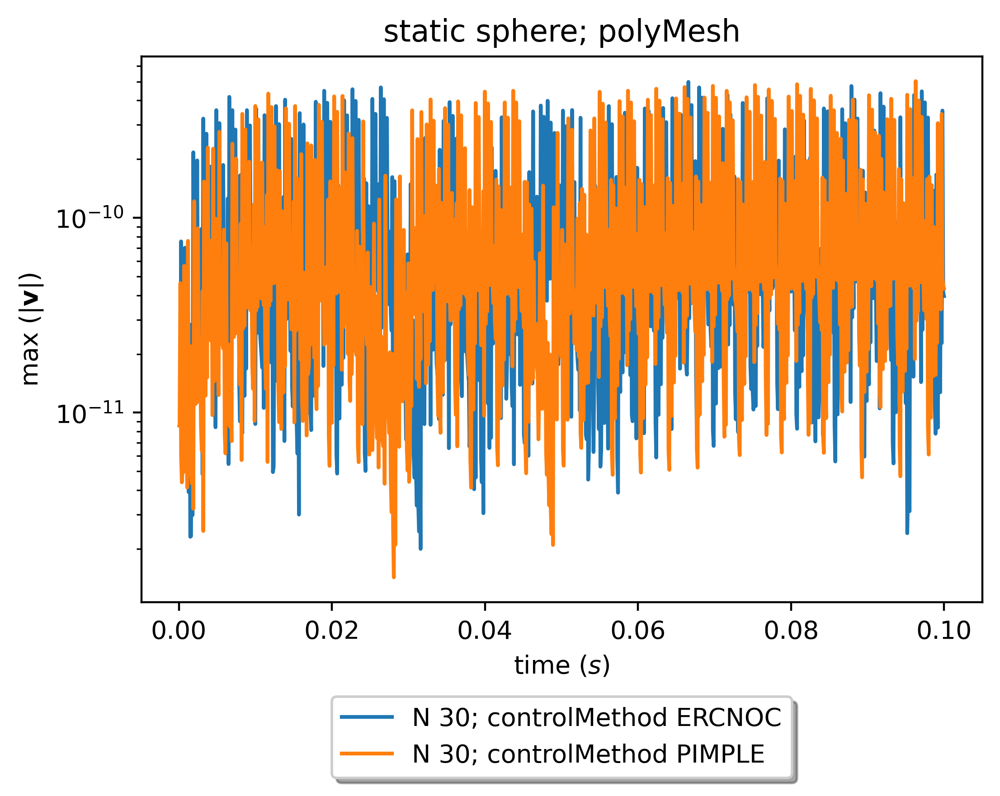

In [38]:
plot_magU(dframe_magU,'polyMesh',30)

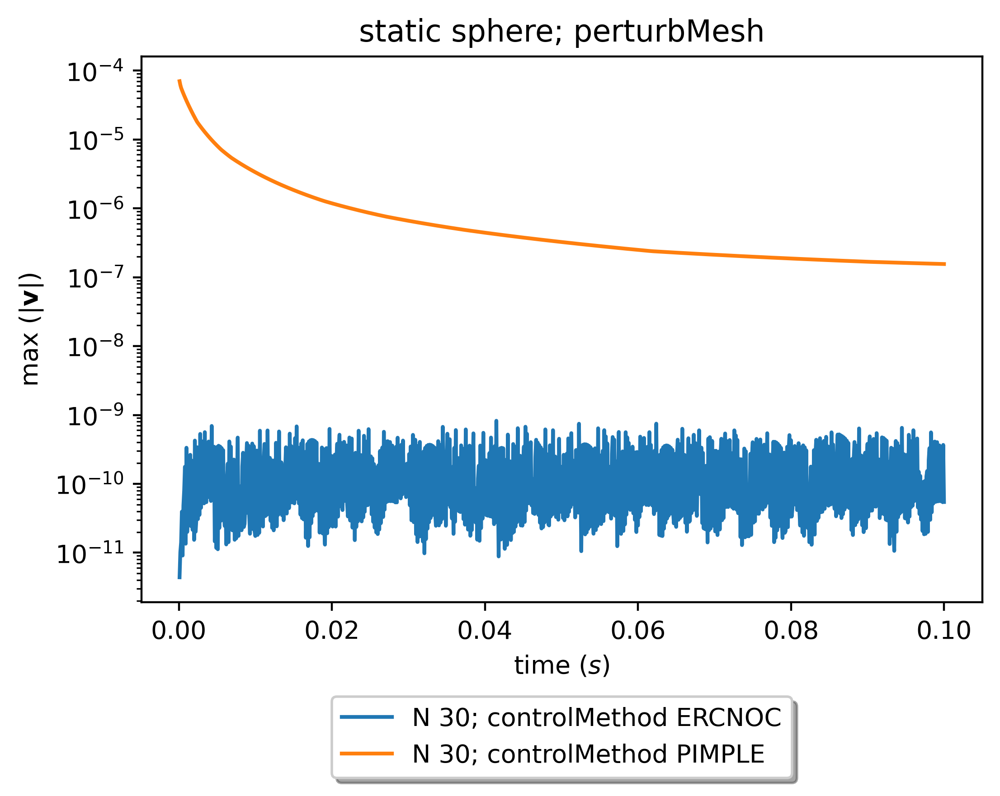

In [17]:
plot_magU(dframe_magU,'perturbMesh',30)

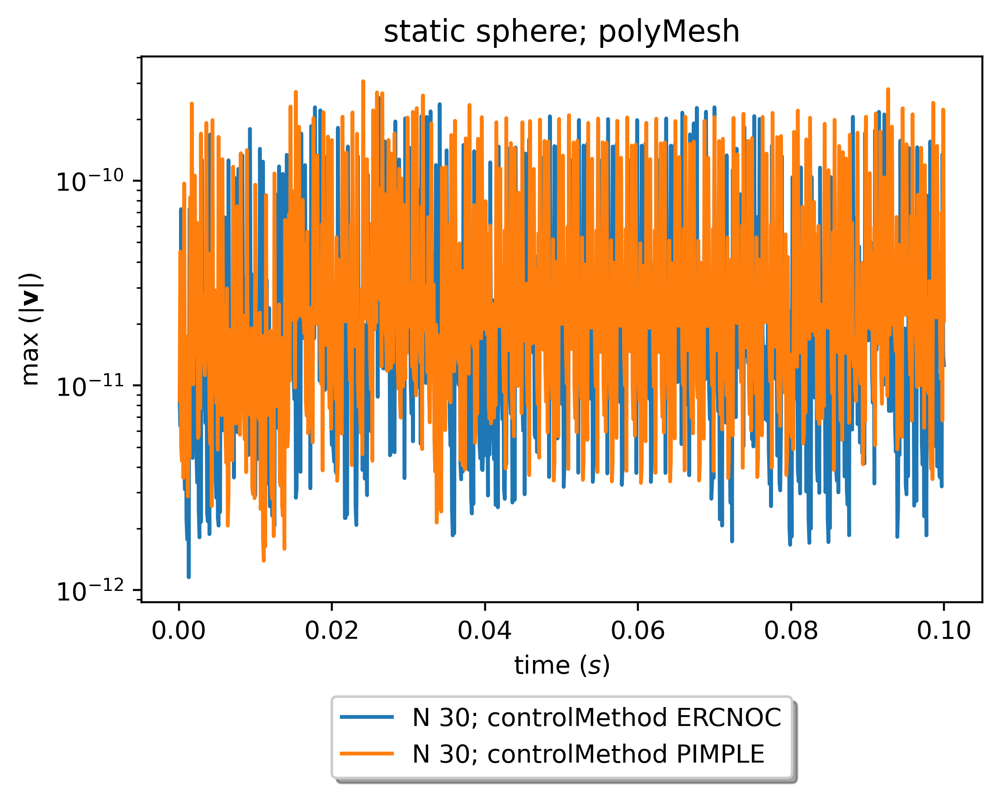

In [18]:
plot_magU(dframe_magU,'polyMesh',30)

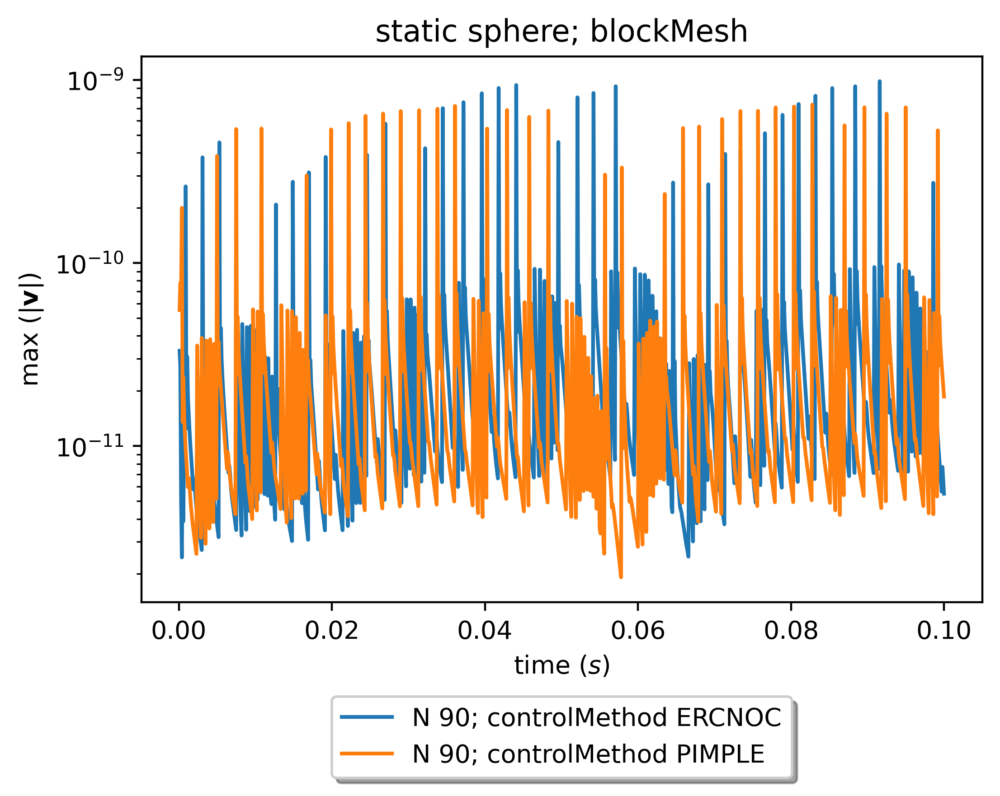

In [19]:
plot_magU(dframe_magU,'blockMesh',90)

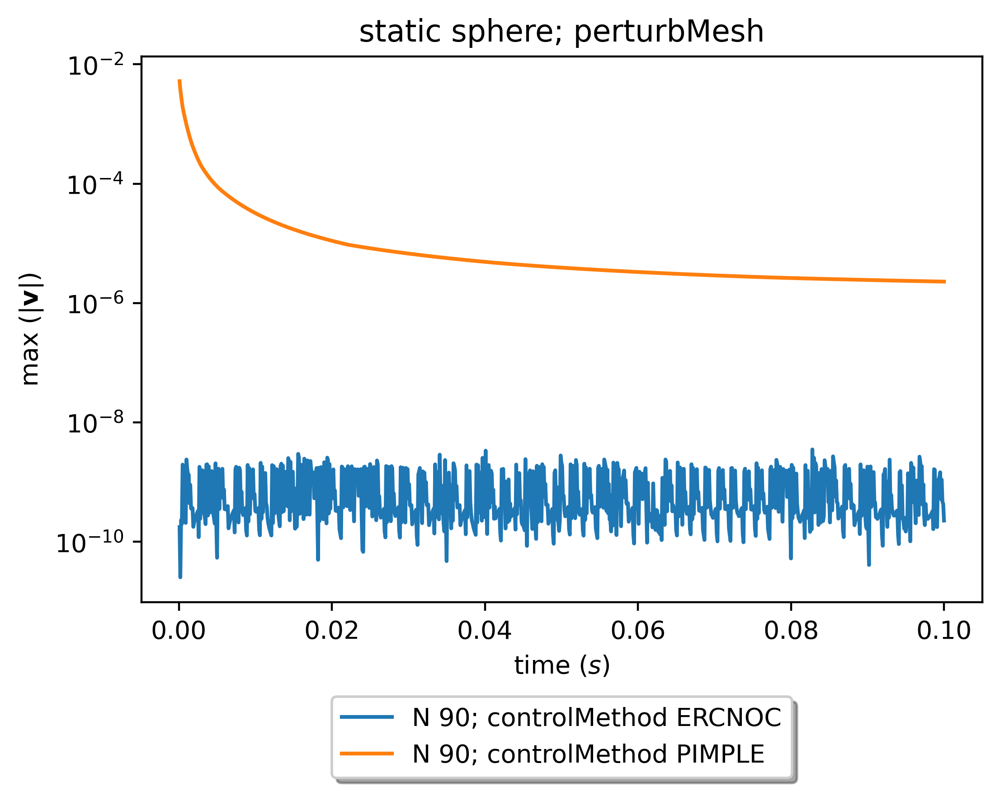

In [20]:
plot_magU(dframe_magU,'perturbMesh',90)

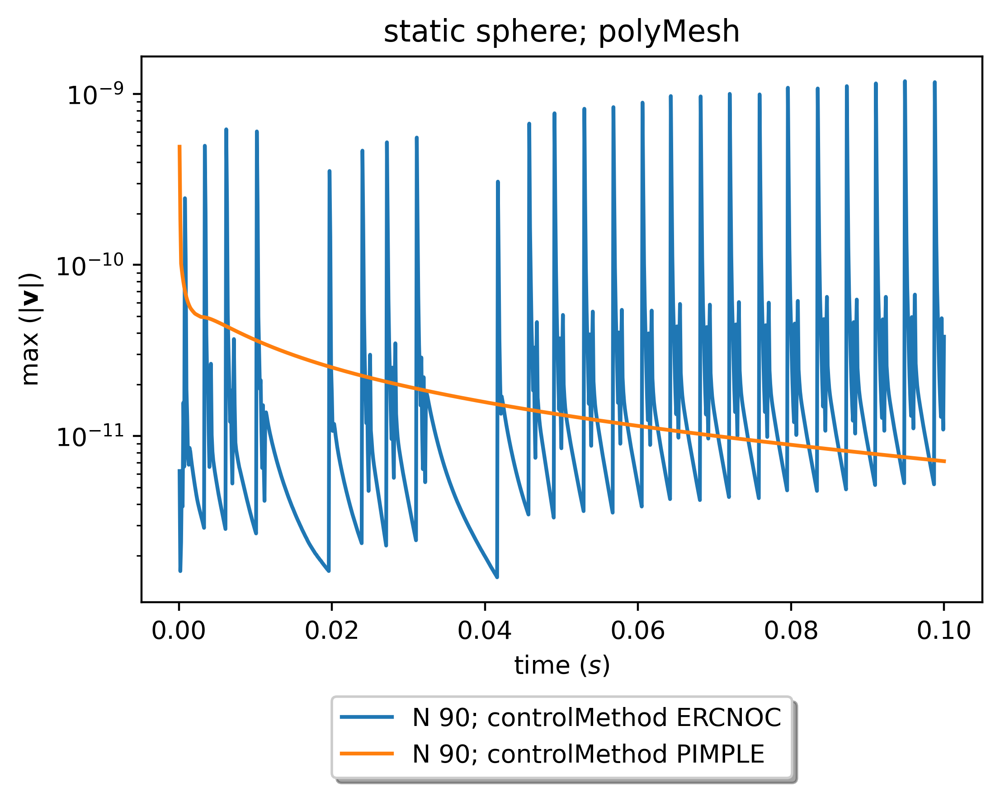

In [21]:
plot_magU(dframe_magU,'polyMesh',90)

In [3]:
agglomerator = da.data_agglomerator("fullStatic3DSphere.parameter","NnonPerStep.dat", 
                                     "./test-fullStatic3DSphere_00000_template")
agglomerator.show_failed_variations()
agglomerator.write_agglomerated_study_data("fullStaticSphere_NnonPerStep.csv")
dframe_NnonPerStep = agglomerator.study_dataframe()
dframe_NnonPerStep = dframe_NnonPerStep.sort_index()

Variants without valid data:
----------------------------
#Variation | Reason
----------------------------
[[0, 1, 4, 9], ['ERCNOC'], ['blockMesh', 'perturbMesh', 'polyMesh'], [30, 60, 90], [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, ...]]
['nNonOrthog', 'nonOrthogControl', 'meshType', 'resolution', 'step']


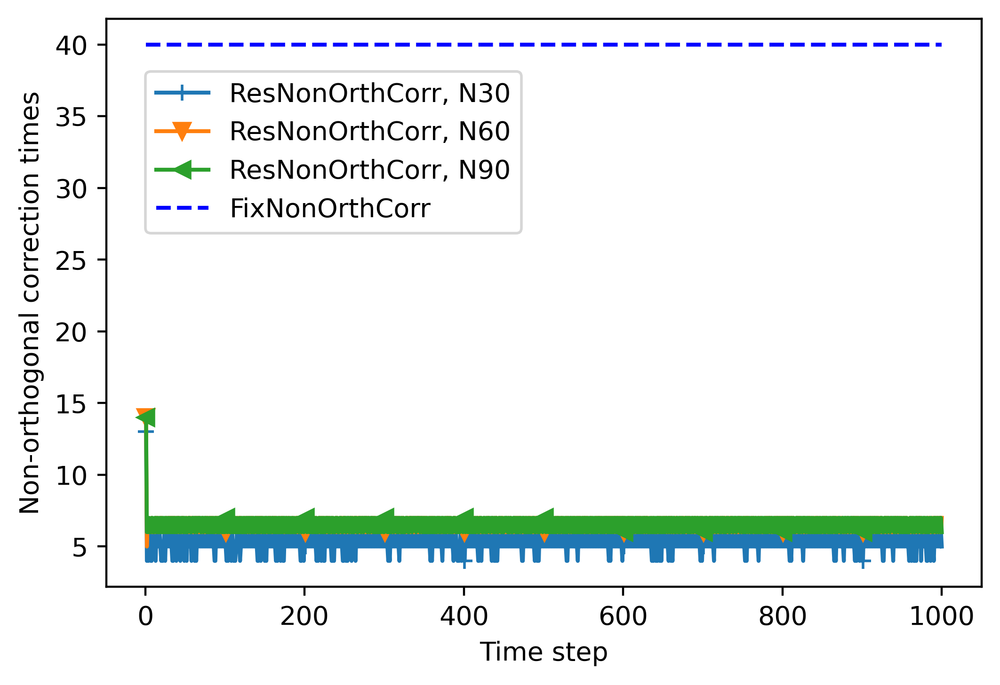

In [98]:
dframe_NnonPerStep
#dfN90_ERCNOC = dframe_magU.loc[('ERCNOC','perturbMesh',90),:]
#dfN90_PIMPLE1 = dframe_magU.loc[('PIMPLE','perturbMesh',90),:]
dfPerturb_N30 = dframe_NnonPerStep.loc[(0,'perturbMesh',30),:]
dfPerturb_N60 = dframe_NnonPerStep.loc[(0,'perturbMesh',60),:]
dfPerturb_N90 = dframe_NnonPerStep.loc[(0,'perturbMesh',90),:]
#dfN90_PIMPLE2 = dframe_magNnon.loc[(1,'perturbMesh',90),:]
#dfN90_PIMPLE5 = dframe_magNnon.loc[(4,'perturbMesh',90),:]
#dfN90_PIMPLE10 = dframe_magNnon.loc[(9,'perturbMesh',90),:]
#['o', 'v', '^', '<', '>', 's', 'p', '*', 'h', 'H', '+', 'x', 'D', 'd', '|', '_']
plt.plot(np.arange(1, 1001),dfPerturb_N30["times"], label="ResNonOrthCorr, N30", marker='+',markevery=100)
plt.plot(np.arange(1, 1001),dfPerturb_N60["times"], label="ResNonOrthCorr, N60", marker='v',markevery=100)
plt.plot(np.arange(1, 1001),dfPerturb_N90["times"], label="ResNonOrthCorr, N90", marker='<',markevery=100)
#plt.axhline(4,color='red', linestyle='--',  label=r'PIMPLE $N_{non}=1$')
#plt.axhline(8, color='green', linestyle='-.', label=r'PIMPLE $N_{non}=2$')
plt.hlines(y=40, xmin=1, xmax=1000, color='blue', linestyle='--',label=r'FixNonOrthCorr')
#plt.plot(dfN90_PIMPLE1["Time"],dfN90_PIMPLE1["max(U)"], label=r"PIMPLE, $N_{non}=1$", marker='o',markevery=50)
#plt.plot(dfN90_PIMPLE2["Time"],dfN90_PIMPLE2["max(U)"], label=r"PIMPLE, $N_{non}=2$", marker='v',markevery=50)
#plt.plot(dfN90_PIMPLE5["Time"],dfN90_PIMPLE5["max(U)"], label=r"PIMEPLE, $N_{non}=5$", marker='<',markevery=50)
#plt.plot(dfN90_PIMPLE10["Time"],dfN90_PIMPLE10["max(U)"], label="PIMPLE, $N_{non}=10$",marker='*',markevery=50)

#plt.title("static sphere; %s" % (Type))
#plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15),
#      fancybox=True, shadow=True, ncol=1)
plt.legend(loc='upper left', bbox_to_anchor=(0.03, 0.93), ncol=1)
#plt.yscale("log")
#yticks = list(plt.yticks()[0])
#yticks.remove(5.0)
#plt.yticks(yticks+[4,8])
plt.xlabel(r"Time step")
plt.ylabel(r"Non-orthogonal correction times")
plt.show()

In [74]:
test=yticks.remove(25.0)
print(yticks)

[0.0, 10.0, 20.0, 30.0, 35.0, 40.0, 45.0]


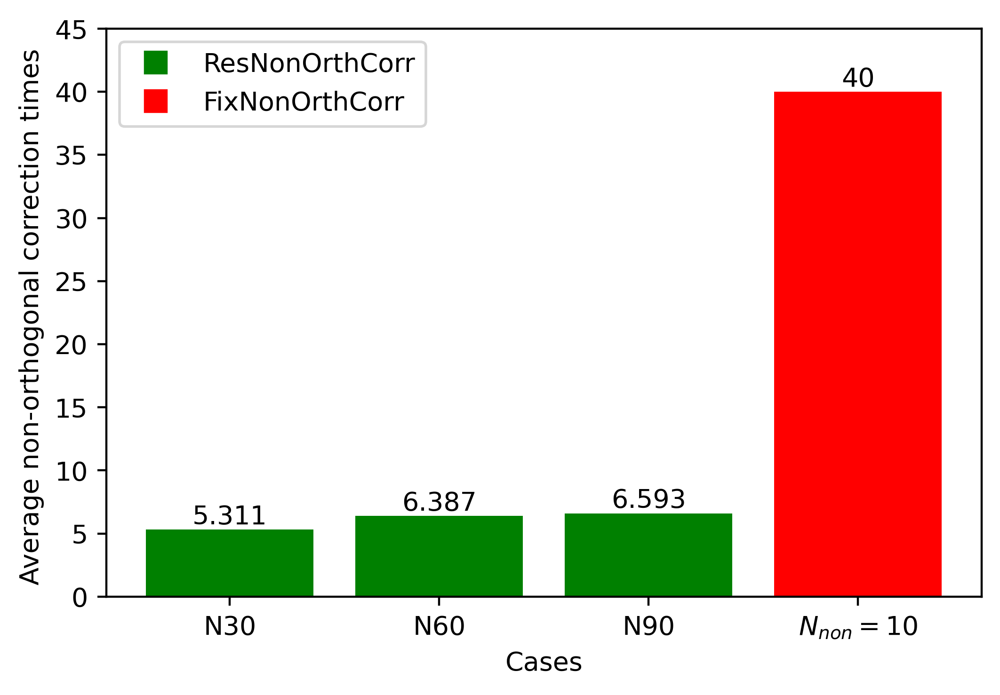

In [41]:

# Your five numbers
#data = [np.mean(dfPerturb_N30["times"]), np.mean(dfPerturb_N60["times"]), np.mean(dfPerturb_N90["times"]), 4, 8,40]
data = [np.mean(dfPerturb_N30["times"]), np.mean(dfPerturb_N60["times"]), np.mean(dfPerturb_N90["times"]), 40]


# Define bin edges and labels
#bin_edges = [0, 10, 20, 30, 40, 50, 60]
#bin_labels = ['N30', 'N60', 'N90', r'$N_{non}=1$', r'$N_{non}=2$',r'$N_{non}=10$']
bin_edges = [0, 10, 20, 30, 40]
bin_labels = ['N30', 'N60', 'N90',r'$N_{non}=10$']


# Specify colors for the first three and last three bars
#colors = ['green', 'green', 'green', 'red', 'red', 'red']
colors = ['green', 'green', 'green', 'red']

# Plot the histogram
plt.bar(bin_labels, data, color=colors)

# Add x-axis label
# plt.xlabel(r'Time step')

# Add y-axis label
plt.ylabel(r"Average non-orthogonal correction times ")

# Annotate each bar with its value
for i, value in enumerate(data):
    plt.text(i, value + 1, str(value), ha='center', va='center')
    
# Annotate the first three bars together
#plt.text(1, 12.5, f'ERCNOC', ha='center', va='center', color='red', fontweight='bold')

# Annotate the last three bars together
#plt.text(4, 42.5, f'PIMPLE', ha='center', va='center', color='green', fontweight='bold')

# Add title
#plt.title('Histogram of Magnitudes')
plt.ylim(0,45)

# Create custom legend
blue_patch = plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='green', markersize=10, label='ResNonOrthCorr')
red_patch = plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='red', markersize=10, label='FixNonOrthCorr')
plt.legend(handles=[blue_patch, red_patch])

# Add custom bin labels
#plt.xticks([5,15,25,35,45,55], bin_labels)

# Display the plot
plt.xlabel(r"Cases")
plt.show()

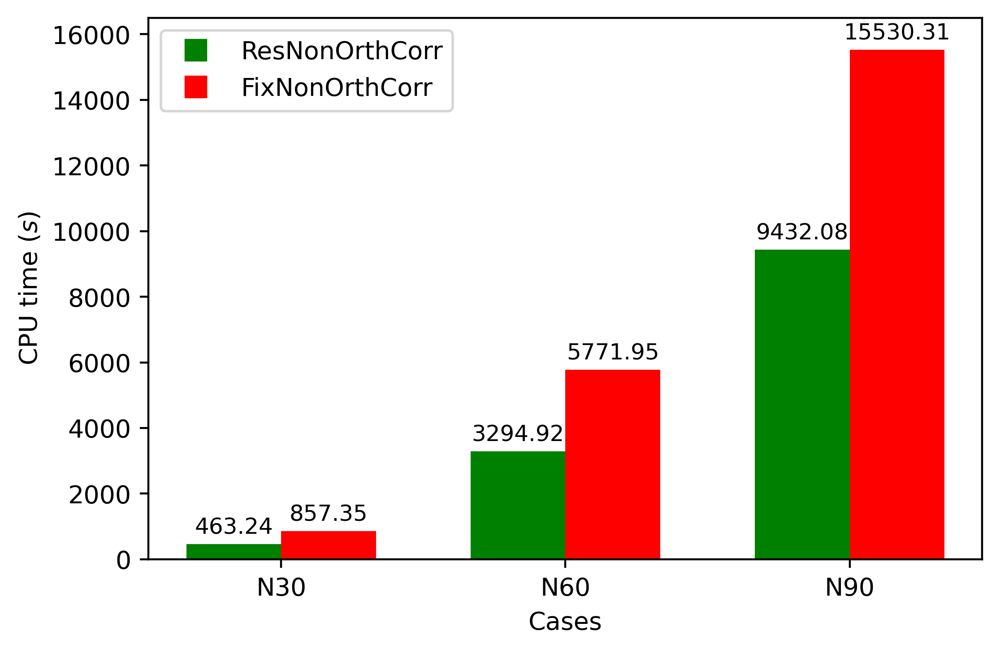

In [97]:

# Your five numbers
#data = [np.mean(dfPerturb_N30["times"]), np.mean(dfPerturb_N60["times"]), np.mean(dfPerturb_N90["times"]), 4, 8,40]
data = np.array([463.24, 857.35, 3294.92, 5771.95, 9432.08, 15530.31 ])

# Define bin edges and labels
#bin_edges = [0, 10, 20, 30, 40, 50, 60]
#bin_labels = ['N30', 'N60', 'N90', r'$N_{non}=1$', r'$N_{non}=2$',r'$N_{non}=10$']
#bin_edges = [0, 10, 20, 30]
labels = ['N30', 'N60', 'N90']

# Set the positions of the groups
group_positions = np.array([0, 1.5,3])

# Set the positions of the bars within each group
bar_width = 0.5
bar_positions = np.array([-0.25, 0.25])

# Specify colors for the first three and last three bars
#colors = ['green', 'green', 'green', 'red', 'red', 'red']
colors = np.array(['green', 'red','green', 'red', 'green', 'red'])
#texts = np.array([r'$N_{non}$=1', r'$N_{non}$=1', r'$N_{non}$=2', r'$N_{non}$=10',r'N_{non}=1', r'N_{non}=1', r'N_{non}=2', r'N_{non}=10',r'N_{non}=1', r'N_{non}=1', r'N_{non}=2', r'N_{non}=10'])
# Plotting the bar chart
for i, group_pos in enumerate(group_positions):
    plt.bar(bar_positions + group_pos, data[i*2:(i+1)*2], width=bar_width, color=colors[i*2:(i+1)*2],label=labels[i])
    #plt.text(bar_positions + group_pos, data[i*4:(i+1)*4] +500, texts[i*4:(i+1)*4], ha='center', va='center')
    for j in [0,1]:
        plt.text(bar_positions[j] + group_pos, data[i*2+j] + 500, data[i*2+j], ha='center', va='center', fontsize=9)
    
# Annotate each bar with its value
#for i, value in enumerate(data):
    #plt.text(i, value + 1, data[i], ha='center', va='center')
    
    # Set x-axis ticks and labels
plt.xticks(group_positions, labels)

plt.ylabel(r"CPU time ($s$)")

plt.ylim(0,16500)


blue_patch = plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='green', markersize=10, label=r'ResNonOrthCorr')
red_patch = plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='red', markersize=10, label=r'FixNonOrthCorr')
plt.legend(handles=[blue_patch, red_patch])

plt.xlabel(r"Cases")
plt.show()

In [74]:
texts = np.array([r'N_{non}=1',' r\'N_{non}=1\'', r'N_{non}=2', r'N_{non}=10',r'N_{non}=1', r'N_{non}=1', r'N_{non}=2', r'N_{non}=10',r'N_{non}=1', r'N_{non}=1', r'N_{non}=2', r'N_{non}=10'])
texts[1]

" r'N_{non}=1'"

In [28]:
np.mean(dfPerturb_N60["times"])

6.387

In [30]:
data

[5.311, 6.387, 6.593, 4, 8, 40]